In [1]:
#import libary
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
#read csv file
df=pd.read_csv('political_tweets.csv',delimiter='|')
df.head()

,Unnamed: 0,last_updated,tweet_id,created_at,user_location,full_text,quote_count,reply_count,retweet_count,favorite_count,...,Pos_VERB_count,Neg_VERB_count,Pos_ADV_count,Neg_ADV_count,neg,neu,pos,compound,weighted_compound,weighted_compound_new
0,0,2019-03-06T17:30:21.000+05:30,1.103136e+18,2019-03-06T03:33:25.000+05:30,Guwahati,Guwahati has gained a lot of prominence in rec...,0,4.0,113.0,113.0,...,0.0,0.0,0.0,0.0,0.000,0.880,0.120,0.6486,73.2918,0.000911
1,1,2019-03-17T18:11:58.000+05:30,1.107333e+18,2019-03-17T17:27:57.000+05:30,NaN,RSS in school days itself? Indoctrinated since...,0,0.0,5.0,5.0,...,0.0,0.0,0.0,0.0,0.332,0.579,0.088,-0.7906,-3.9530,-0.000303
2,2,2019-03-23T18:07:38.000+05:30,1.109417e+18,2019-03-23T11:28:31.000+05:30,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,0,4.0,31.0,31.0,...,0.0,0.0,0.0,0.0,0.130,0.870,0.000,-0.6900,-21.3900,-0.000577
3,3,2019-03-11T17:47:32.000+05:30,1.100300e+18,2019-02-26T07:40:28.000+05:30,NaN,"India's #Icecream Industry stands at 15,000 cr...",0,0.0,3.0,3.0,...,0.0,0.0,0.0,0.0,0.000,0.955,0.045,0.1779,0.5337,-0.000232
4,4,2019-02-27T18:18:42.000+05:30,1.100733e+18,2019-02-27T12:21:18.000+05:30,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,0,0.0,9.0,9.0,...,0.0,0.0,0.0,0.0,0.362,0.638,0.000,-0.9638,-8.6742,-0.000377


In [3]:
df['full_text'][0]

"Guwahati has gained a lot of prominence in recent years due to PM Shri @narendramodi ji's #ActEast Policy. \n\nThe infrastructural upgrades undertaken will go a long way in establishing Guwahati as one of India's smart cities and as gateway to @ASEAN countries: CM"

In [4]:
df['full_text']

0        Guwahati has gained a lot of prominence in rec...
1        RSS in school days itself? Indoctrinated since...
2        Words don't exist in Vaccum!\nModi's post Pulw...
3        India's #Icecream Industry stands at 15,000 cr...
4        *40 CRPF Jawans killed in Pulwama Attack\n*IAF...
                               ...                        
46038    My article for https://t.co/b8FIn1GYyz today -...
46039    Not only in #Noida #homebuyers like #AntrikshS...
46040    Modi did nothing in last 5 yrs other than the ...
46041    Congress turns up heat on White House for answ...
46042    #VaranasiDebate By announcing NYAY scheme Cong...
Name: full_text, Length: 46043, dtype: object

In [5]:
df.shape

(46043, 44)

In [6]:
#the number of null value in each column
df.isnull().sum()

Unnamed: 0                       0
last_updated                     0
tweet_id                         2
created_at                       2
user_location                 5779
full_text                        2
quote_count                   1402
reply_count                   1410
retweet_count                    7
favorite_count                   0
hashtags                     36836
user_mentions_screen_name    28320
OfImportance                     7
subject                          7
ADJ                              7
NOUN                             7
VERB                             7
ADV                              7
Pos_ADJ                          7
Neg_ADJ                          7
Pos_NOUN                         7
Neg_NOUN                         7
Pos_VERB                         8
Neg_VERB                         8
Pos_ADV                         12
Neg_ADV                          8
City                         30330
State                        28788
District            

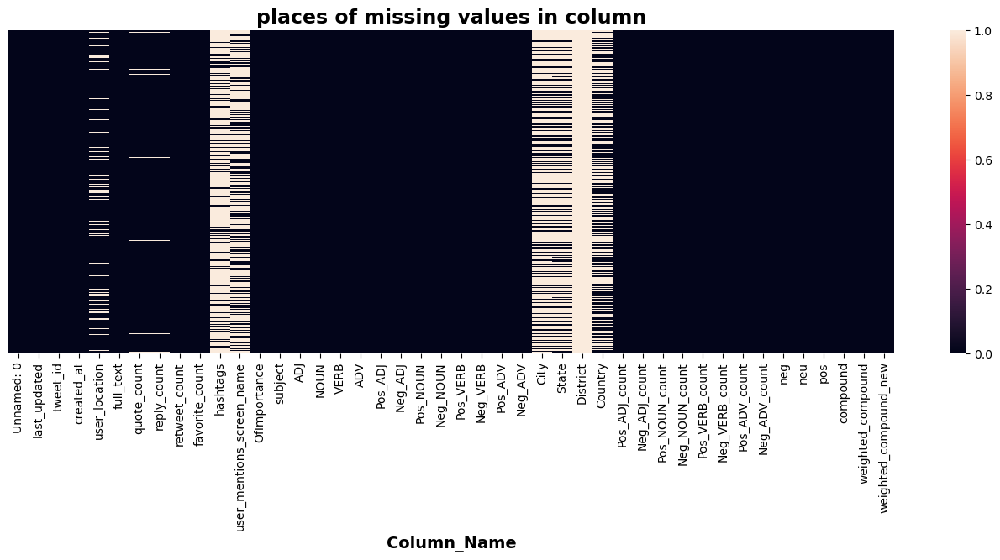

In [7]:
#plot a heat map for missing value in column
plt.figure(figsize=(17,5))
sns.heatmap(df.isnull(),cbar=True,yticklabels=False)
plt.xlabel("Column_Name",size=14,weight="bold")
plt.title("places of missing values in column",fontweight="bold",size=17)
plt.show()

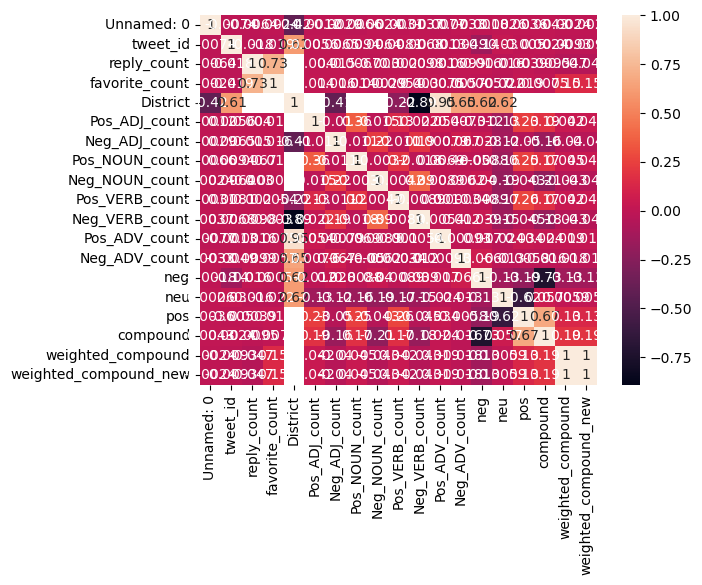

In [8]:
#create a correlation matrix
corrmatrix=df.corr()
sns.heatmap(corrmatrix,annot=True)
plt.show()

In [9]:
df['hashtags']

0                                             ActEast
1                                                 NaN
2                                                 NaN
3                                            Icecream
4                                                 NaN
                             ...                     
46038                                             NaN
46039    Noida,homebuyers,AntrikshSanskriti,Ghaziabad
46040                                             NaN
46041                                             NaN
46042                                  VaranasiDebate
Name: hashtags, Length: 46043, dtype: object

In [10]:
#fill the missing value with empty string
df['hashtags']=df[['hashtags']].fillna('')
df['user_location']=df[['user_location']].fillna('')
df['full_text']=df[['full_text']].fillna('')
df['subject']=df[['subject']].fillna('')

In [11]:
#the number of missing value in each column
df.isnull().sum()

Unnamed: 0                       0
last_updated                     0
tweet_id                         2
created_at                       2
user_location                    0
full_text                        0
quote_count                   1402
reply_count                   1410
retweet_count                    7
favorite_count                   0
hashtags                         0
user_mentions_screen_name    28320
OfImportance                     7
subject                          0
ADJ                              7
NOUN                             7
VERB                             7
ADV                              7
Pos_ADJ                          7
Neg_ADJ                          7
Pos_NOUN                         7
Neg_NOUN                         7
Pos_VERB                         8
Neg_VERB                         8
Pos_ADV                         12
Neg_ADV                          8
City                         30330
State                        28788
District            

In [12]:
#print the information of each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46043 entries, 0 to 46042
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 46043 non-null  int64  
 1   last_updated               46043 non-null  object 
 2   tweet_id                   46041 non-null  float64
 3   created_at                 46041 non-null  object 
 4   user_location              46043 non-null  object 
 5   full_text                  46043 non-null  object 
 6   quote_count                44641 non-null  object 
 7   reply_count                44633 non-null  float64
 8   retweet_count              46036 non-null  object 
 9   favorite_count             46043 non-null  float64
 10  hashtags                   46043 non-null  object 
 11  user_mentions_screen_name  17723 non-null  object 
 12  OfImportance               46036 non-null  object 
 13  subject                    46043 non-null  obj

In [13]:
df=df[['user_location','full_text','subject','hashtags']]
df.head()

,user_location,full_text,subject,hashtags
0,Guwahati,Guwahati has gained a lot of prominence in rec...,Bjp,ActEast
1,,RSS in school days itself? Indoctrinated since...,Bjp,
2,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,Bjp,
3,,"India's #Icecream Industry stands at 15,000 cr...",Congress,Icecream
4,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Bjp,


In [15]:
#the unique value in subject column
df.subject.unique()

array(['Bjp', 'Congress', 'Others', '', '[]', "['not', 'instead']",
       "['govt']", "['now']"], dtype=object)

In [21]:
df['original_text']=df['full_text']
bjp_election=df[df.subject=='Bjp']
bjp_election.head()

,user_location,full_text,subject,hashtags,original_text
0,Guwahati,guwahati gain lot promin recent year due pm sh...,Bjp,ActEast,guwahati gain lot promin recent year due pm sh...
1,,rss school day indoctrin sinc childhood thrice...,Bjp,,rss school day indoctrin sinc childhood thrice...
2,New Delhi,word dont exist vaccummodi post pulwama word g...,Bjp,,word dont exist vaccummodi post pulwama word g...
4,Delhi | Odisha,crpf jawan kill pulwama attackiaf strike paki...,Bjp,,crpf jawan kill pulwama attackiaf strike paki...
5,New Delhi,andhra mr cm ncbn gave minor muslim politician...,Bjp,,andhra mr cm ncbn gave minor muslim politician...


In [22]:
congress_election=df[df.subject=='Congress']
congress_election.head()

,user_location,full_text,subject,hashtags,original_text
3,,india icecream industri stand crore fastest g...,Congress,Icecream,india icecream industri stand crore fastest g...
7,,multitud support across length breath bihar ca...,Congress,,multitud support across length breath bihar ca...
8,New Delhi,pappus lawyer repli court latest april repli...,Congress,,pappus lawyer repli court latest april repli...
9,https://wwwfacebookcom/blackeyepolitics/,ilhan omar made name one radic leftw member na...,Congress,,ilhan omar made name one radic leftw member na...
12,Odisha,odisha bless mani river still struggl clean wa...,Congress,,odisha bless mani river still struggl clean wa...


In [16]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [17]:
import nltk
import re
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [18]:
stemmer=nltk.SnowballStemmer("english")
from nltk.corpus import stopwords
import string
stopwords=set(stopwords.words('english'))

In [19]:
#preprocess the text
def clean(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = [word for word in text.split(' ') if word not in stopwords]
    text=" ".join(text)
    text = [stemmer.stem(word) for word in text.split(' ')]
    text=" ".join(text)
    return text

df["full_text"] = df["full_text"].apply(clean)


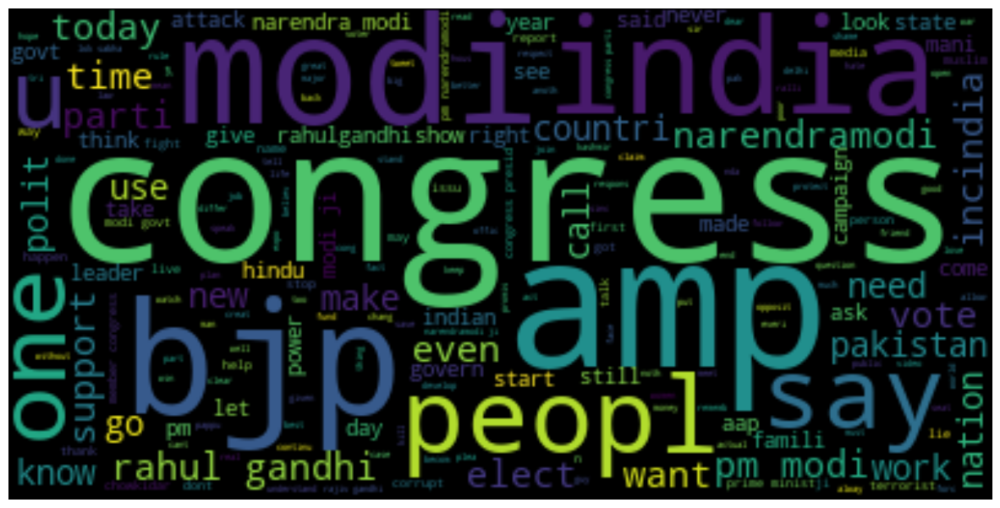

In [20]:
#display the wordcloud for the tweet
text = " ".join(i for i in df.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

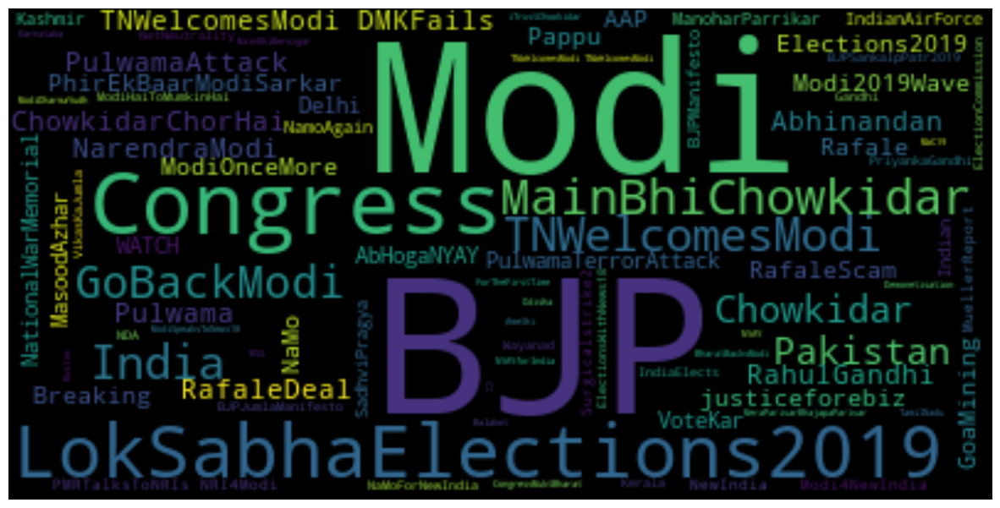

In [21]:
#plot the wordcloud for the hashtags
import string
text = " ".join(str(i) for i in df.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

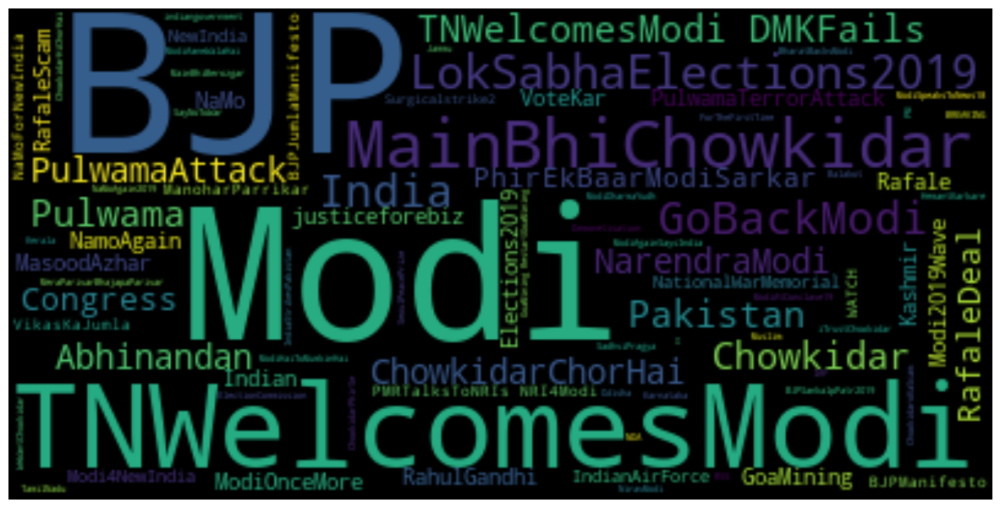

In [22]:
import string
text = " ".join(str(i) for i in bjp_election.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

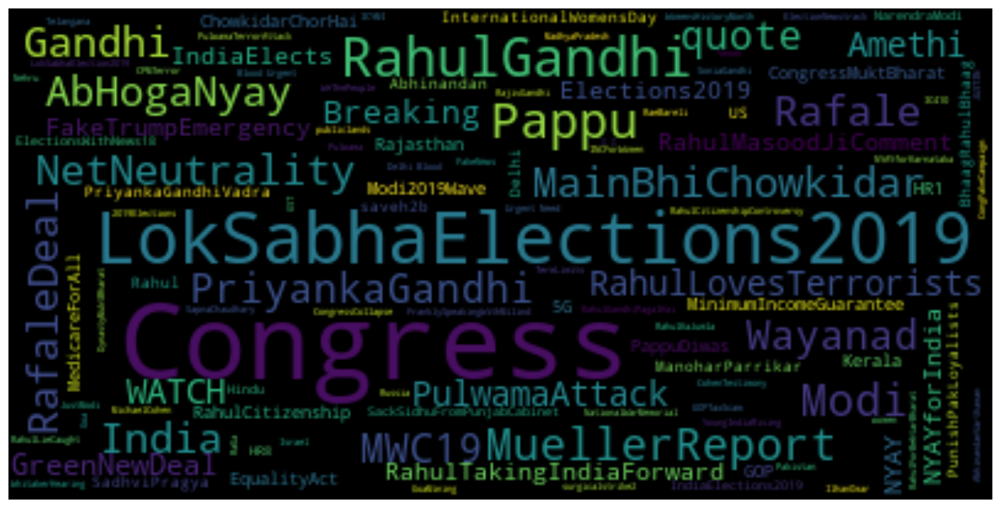

In [23]:
import string
text = " ".join(str(i) for i in congress_election.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

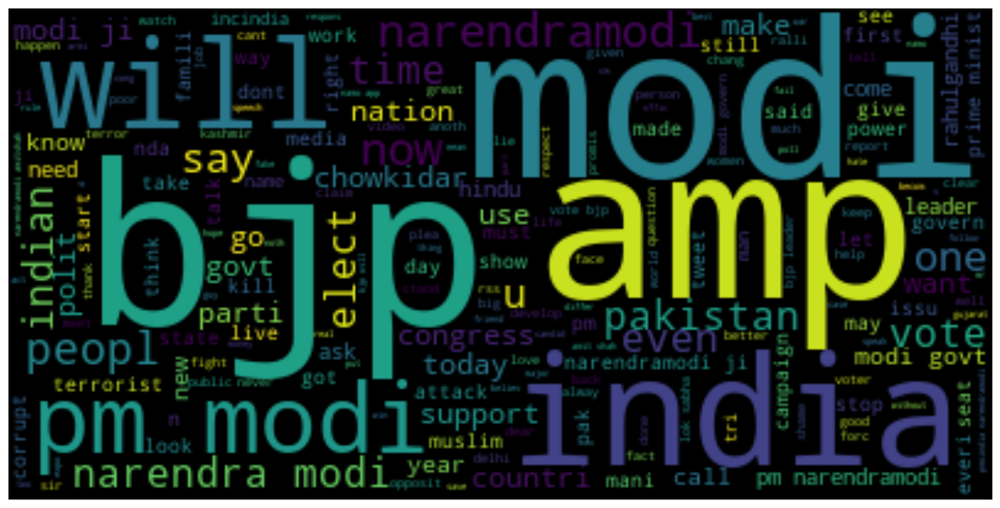

In [24]:
bjp_election["full_text"]=bjp_election["full_text"].apply(clean)
congress_election["full_text"]=congress_election["full_text"].apply(clean)

import string
text = " ".join(str(i) for i in bjp_election.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

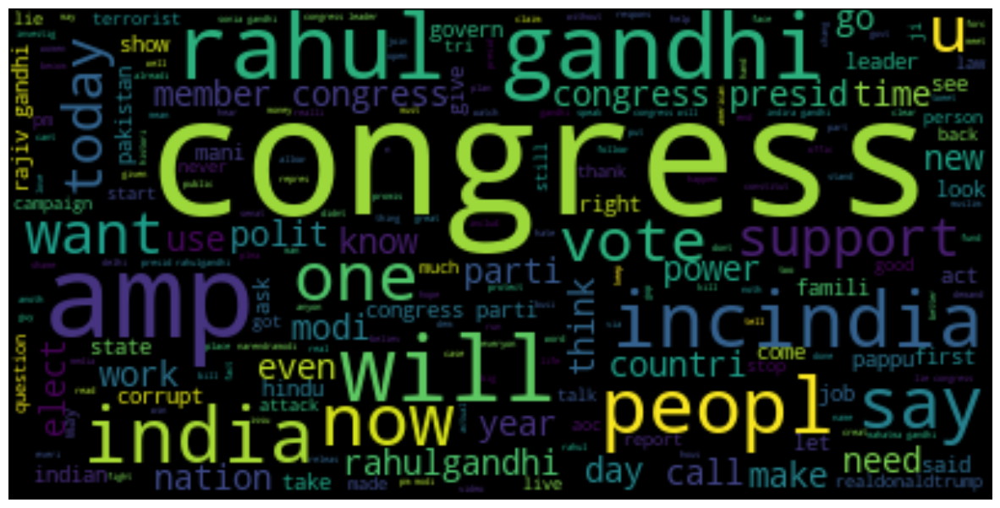

In [25]:
import string
text = " ".join(str(i) for i in congress_election.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [20]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [23]:
#calculate the sentiment for every tweet

bjp_election['sentiment'] = bjp_election['full_text'].apply(lambda x: sid.polarity_scores(x))
congress_election['sentiment'] = congress_election['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

bjp_election['sentiment_overall'] = bjp_election['sentiment'].apply(lambda x: sentimentVerdict(x))
congress_election['sentiment_overall'] = congress_election['sentiment'].apply(lambda x: sentimentVerdict(x))


In [23]:
bjp_election.head()

,user_location,full_text,subject,hashtags,original_text,sentiment,sentiment_overall
0,Guwahati,Guwahati has gained a lot of prominence in rec...,Bjp,ActEast,Guwahati has gained a lot of prominence in rec...,"{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compou...",Positive
1,,RSS in school days itself? Indoctrinated since...,Bjp,,RSS in school days itself? Indoctrinated since...,"{'neg': 0.332, 'neu': 0.579, 'pos': 0.088, 'co...",Negative
2,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,Bjp,,Words don't exist in Vaccum!\nModi's post Pulw...,"{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compou...",Negative
4,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Bjp,,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,"{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'comp...",Negative
5,New Delhi,"In Andhra, Mr. CM @ncbn gave minority to a Mus...",Bjp,,"In Andhra, Mr. CM @ncbn gave minority to a Mus...","{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'comp...",Positive


In [41]:
bjp_election[['original_text','sentiment_overall','subject']]
bjp_election.to_csv('bjp_election.csv')

In [24]:
congress_election.head()

,user_location,full_text,subject,hashtags,original_text,sentiment,sentiment_overall
3,,"India's #Icecream Industry stands at 15,000 cr...",Congress,Icecream,"India's #Icecream Industry stands at 15,000 cr...","{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'comp...",Positive
7,,A multitude of supporters from across the leng...,Congress,,A multitude of supporters from across the leng...,"{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'comp...",Positive
8,New Delhi,PAPPU's lawyer to reply court latest by10.30 a...,Congress,,PAPPU's lawyer to reply court latest by10.30 a...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
9,https://wwwfacebookcom/blackeyepolitics/,Ilhan Omar has made a name for herself as one ...,Congress,,Ilhan Omar has made a name for herself as one ...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
12,Odisha,Odisha is blessed with so many rivers but stil...,Congress,,Odisha is blessed with so many rivers but stil...,"{'neg': 0.061, 'neu': 0.688, 'pos': 0.251, 'co...",Positive


In [25]:
congress_election[['original_text','sentiment_overall','subject']]
congress_election.to_csv('congress_election.csv')

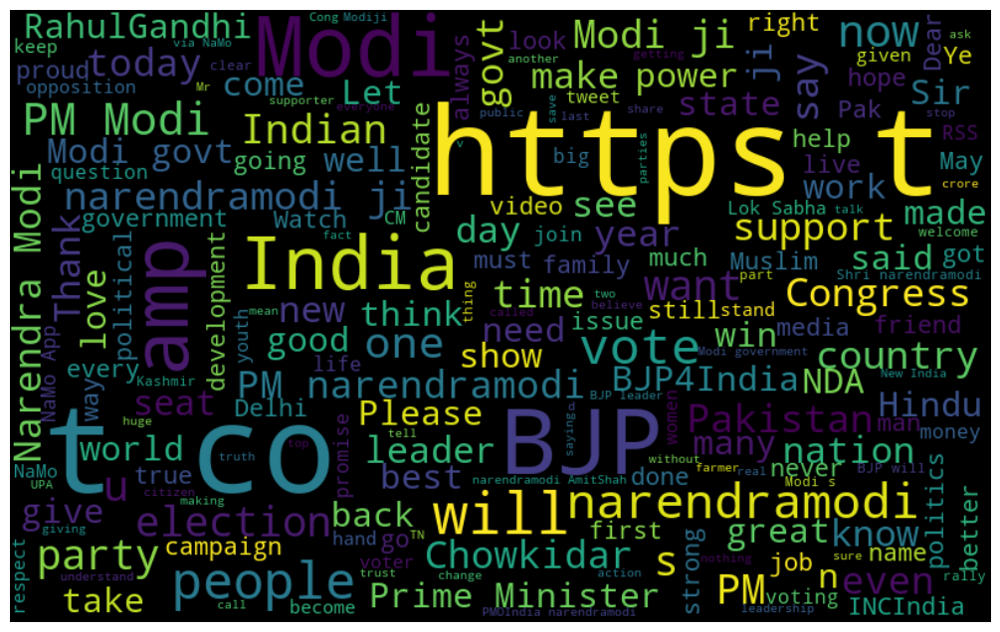

In [42]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

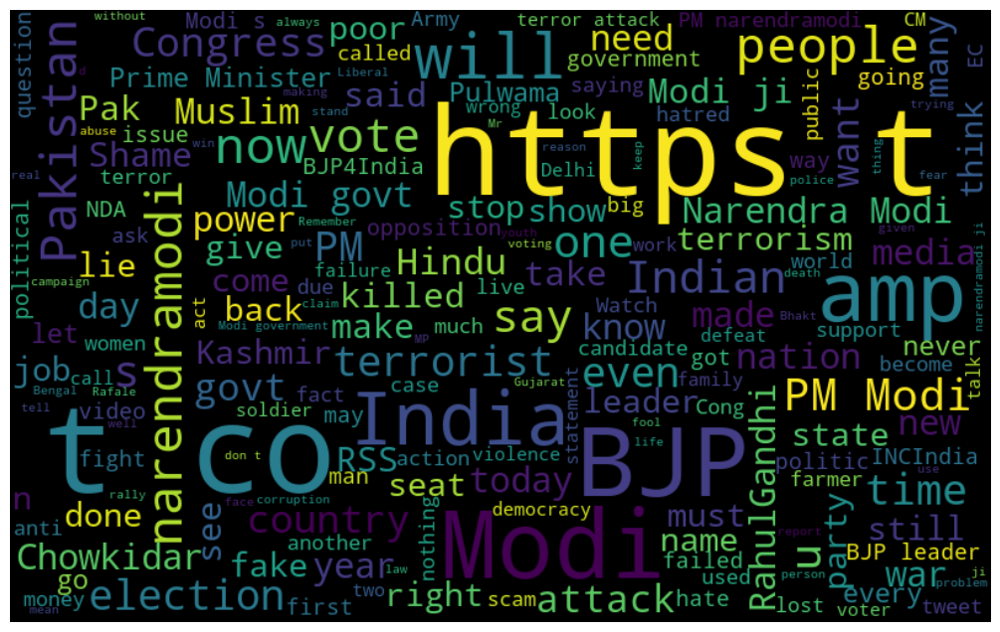

In [43]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

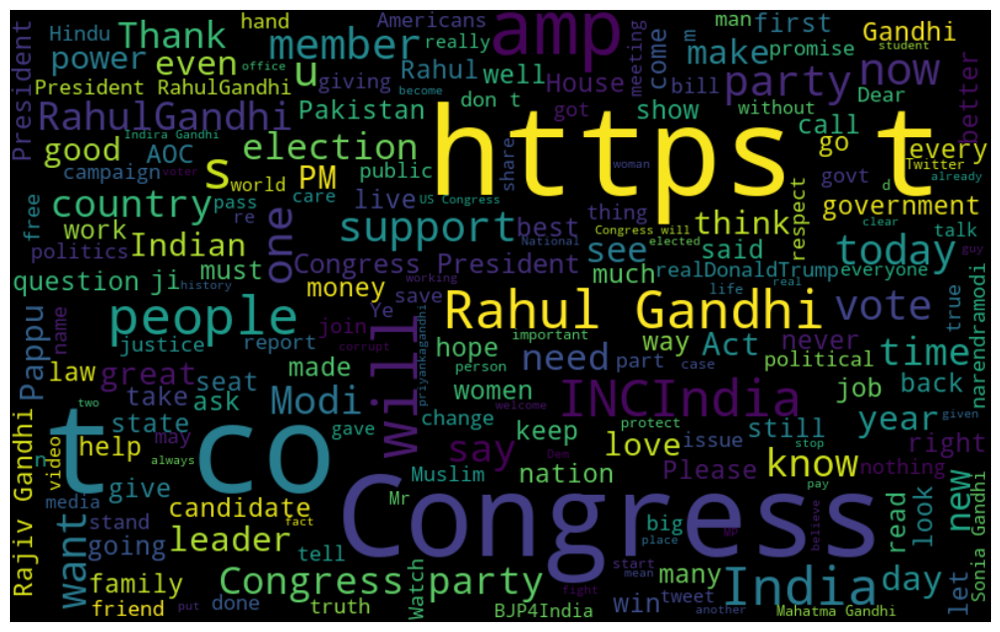

In [44]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

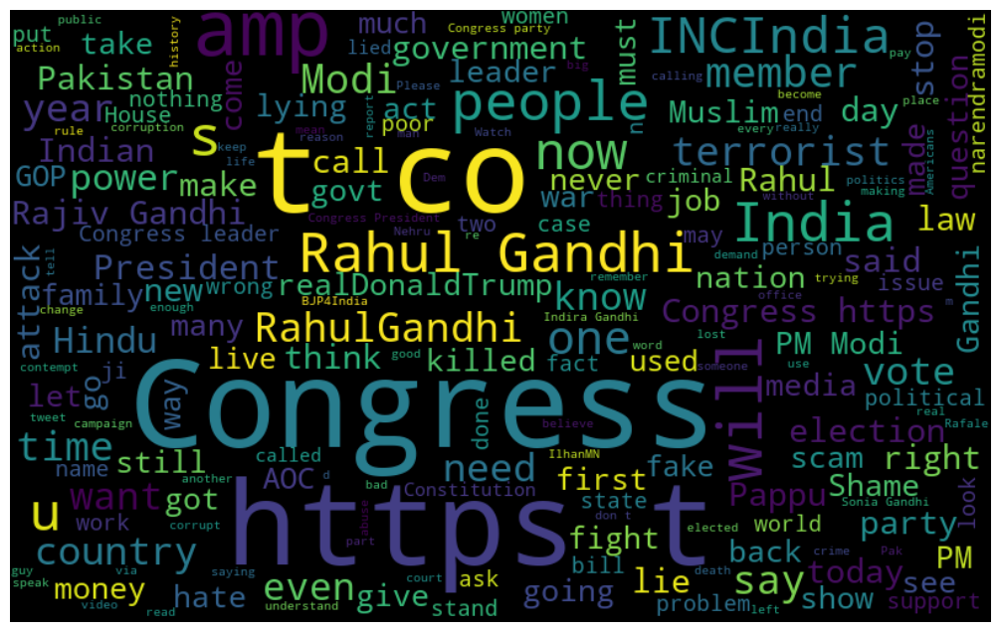

In [45]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

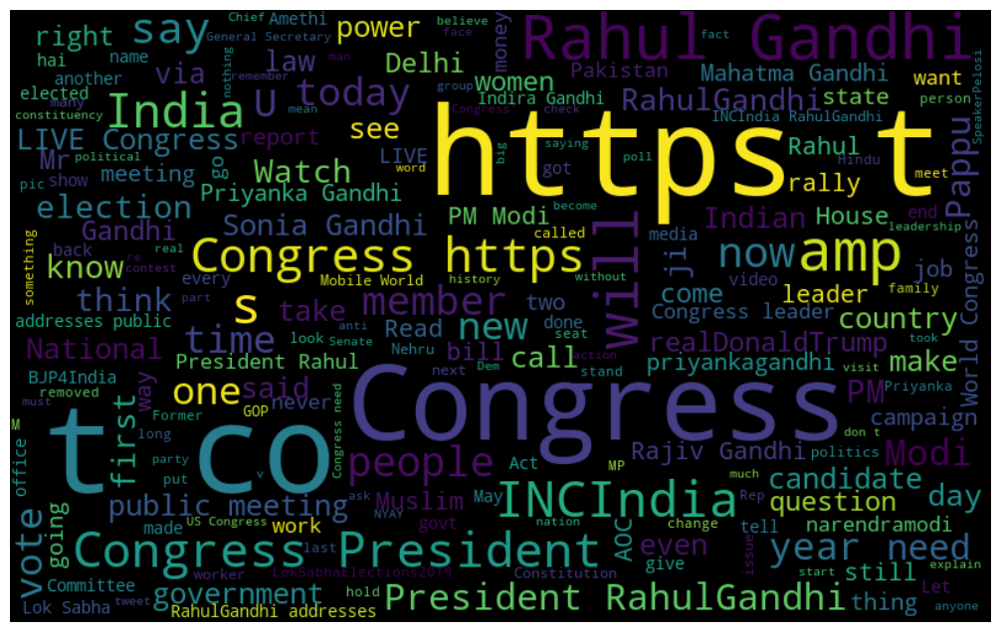

In [46]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

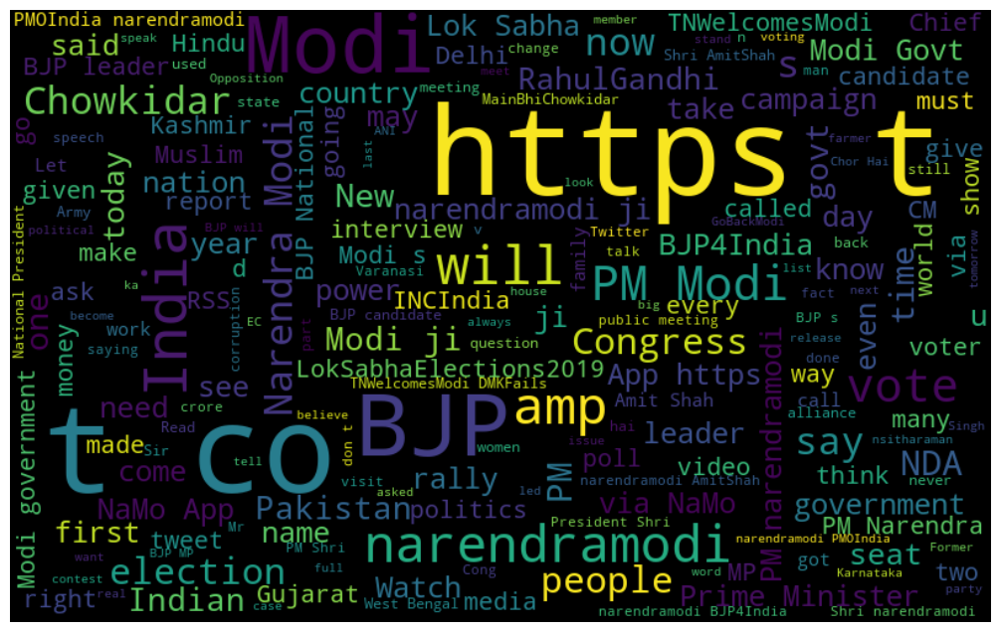

In [47]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

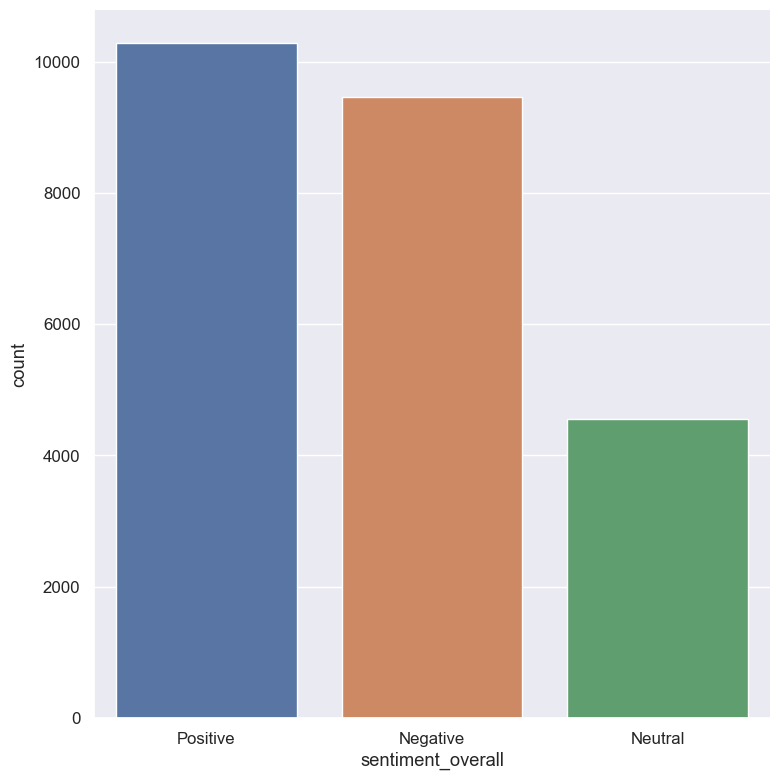

In [23]:
#plot the number of diff type of tweet for bjp based
sns.set(font_scale=1.1)
sns.catplot("sentiment_overall", data=bjp_election, kind="count", height=8)

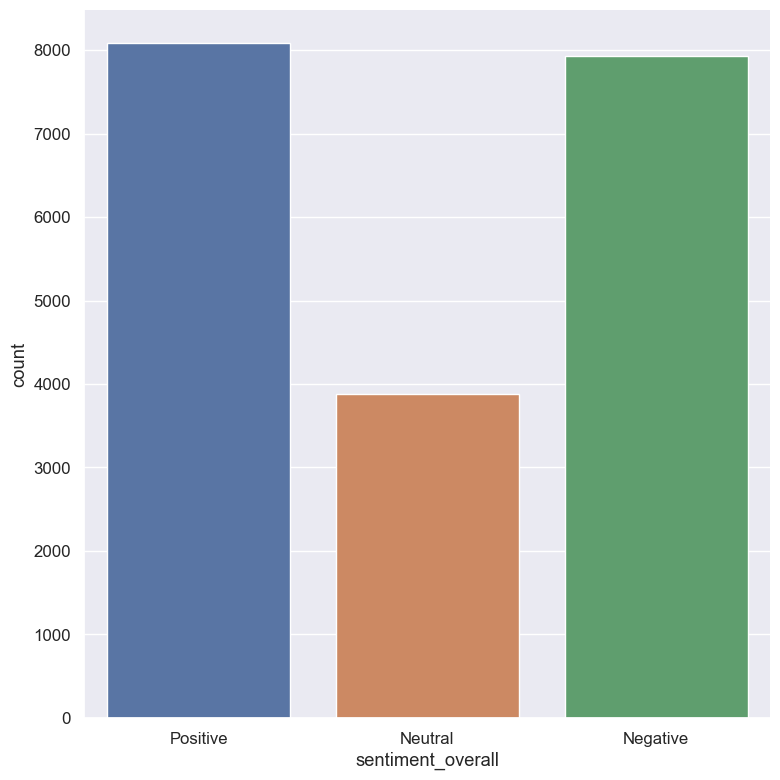

In [24]:
#the number of tweet for congress based
sns.set(font_scale=1.1)
sns.catplot("sentiment_overall", data=congress_election, kind="count", height=8)

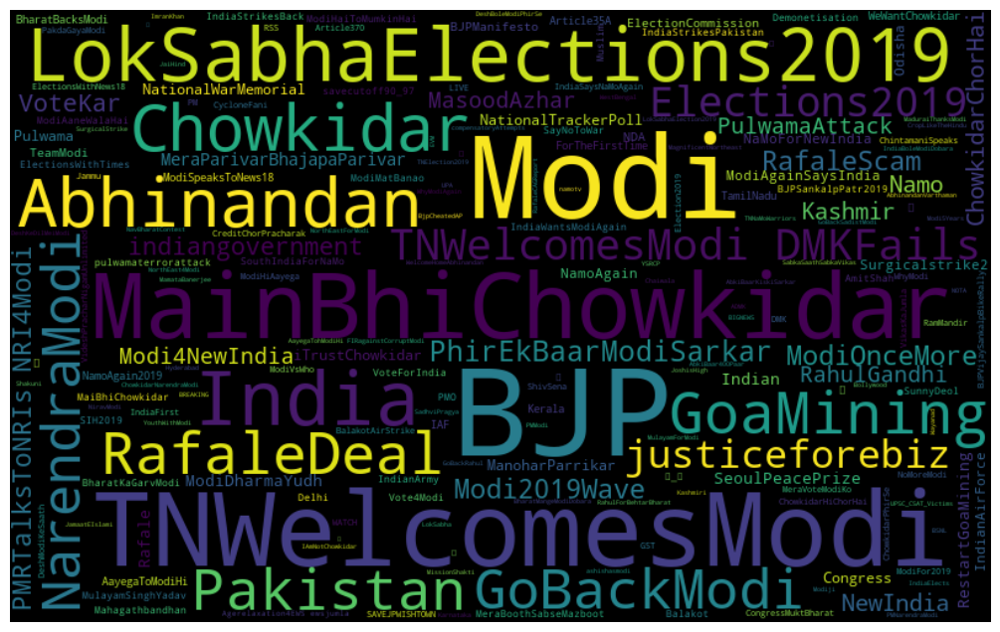

In [40]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

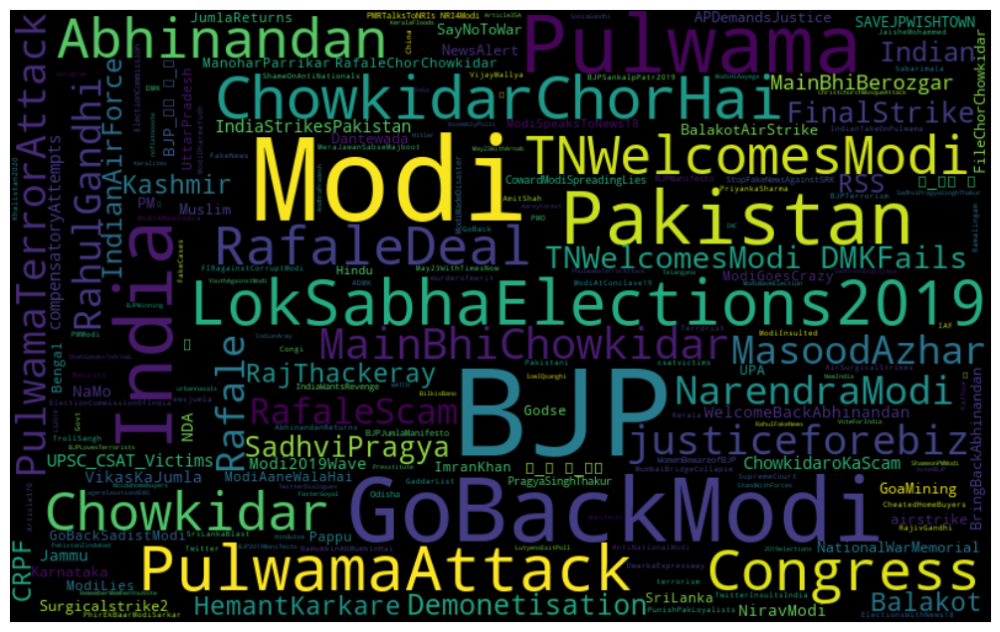

In [41]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

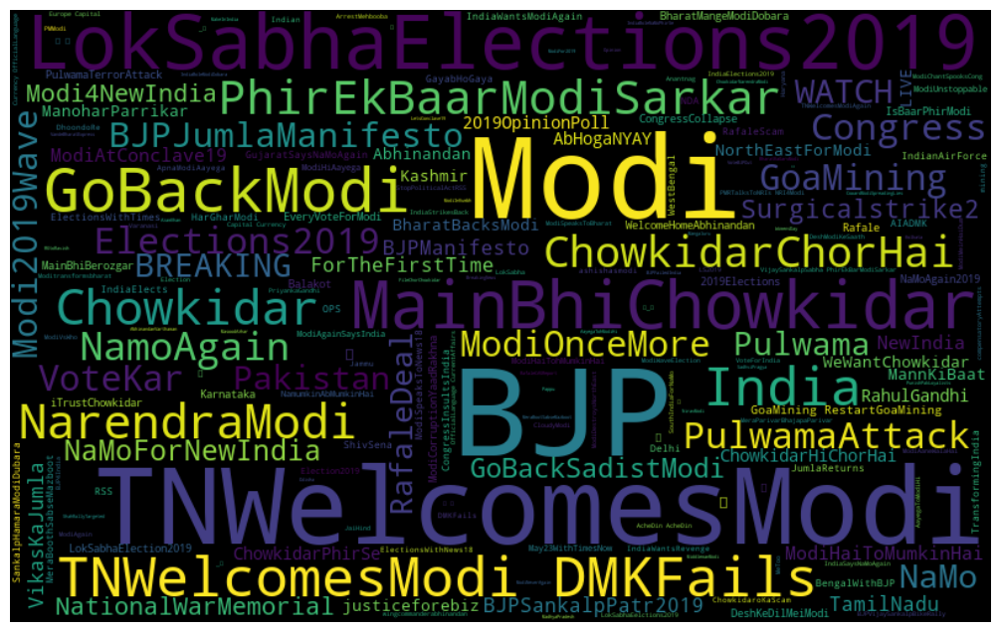

In [42]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

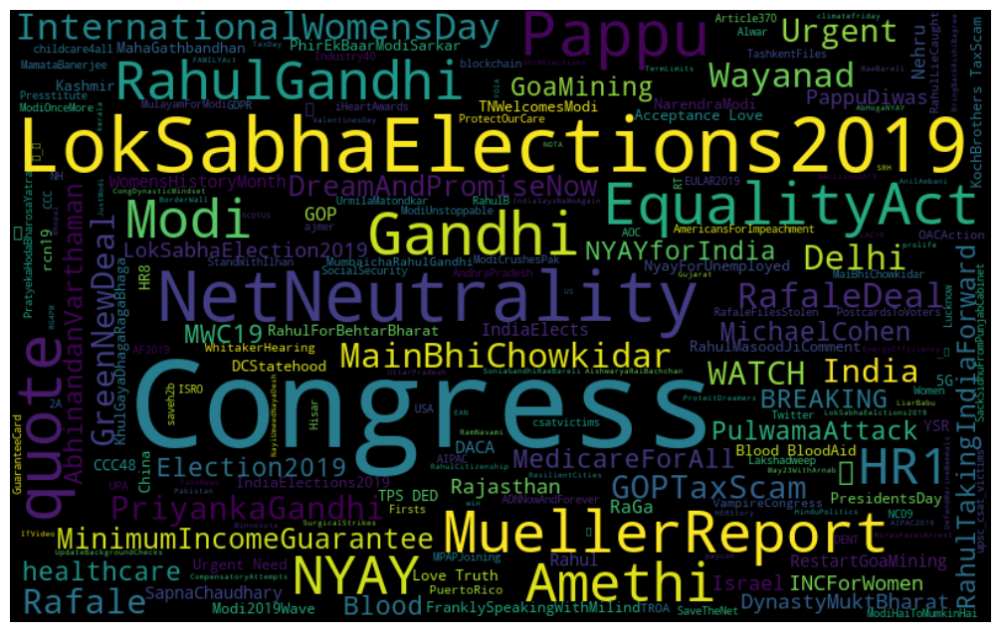

In [43]:
all_words=" ".join([sentence for sentence in congress_election['hashtags'][congress_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

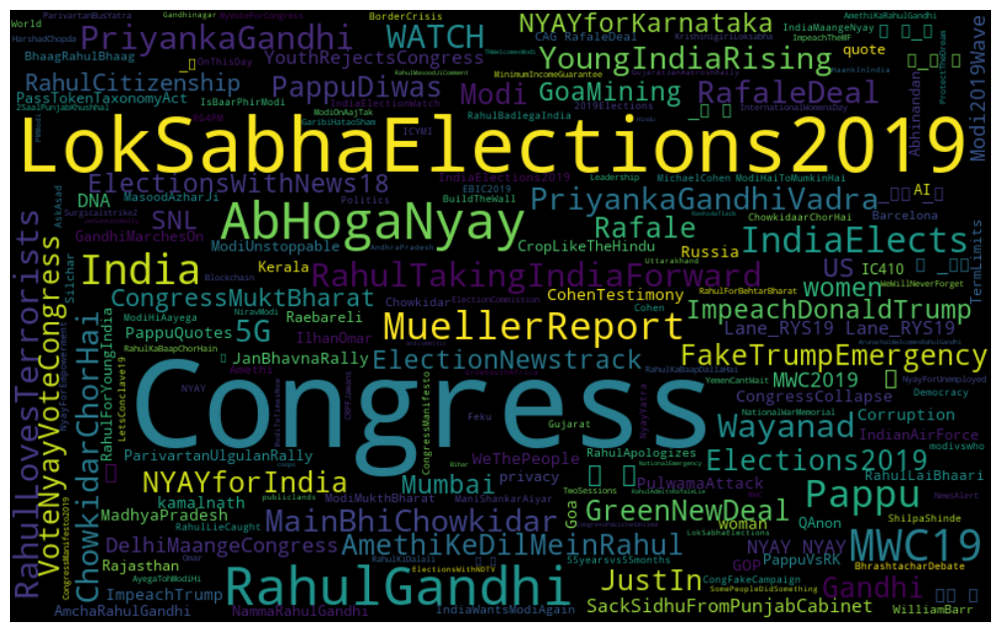

In [44]:
all_words=" ".join([sentence for sentence in congress_election['hashtags'][congress_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [25]:
new_bjp=bjp_election[['full_text','sentiment_overall']]
new_bjp.head()

,full_text,sentiment_overall
0,Guwahati has gained a lot of prominence in rec...,Positive
1,RSS in school days itself? Indoctrinated since...,Negative
2,Words don't exist in Vaccum!\nModi's post Pulw...,Negative
4,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Negative
5,"In Andhra, Mr. CM @ncbn gave minority to a Mus...",Positive


In [26]:
#converting a collection of text to matrix
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_bjp['full_text'])

In [27]:
#train test split the dataset for bjp based
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_bjp['sentiment_overall'],random_state=42,stratify=new_bjp['sentiment_overall'])

In [28]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(18219, 1000)
(6074, 1000)
(18219,)
(6074,)


training accuracy Score    :  0.7433997475163291
Validation accuracy Score :  0.7113928218636812
              precision    recall  f1-score   support

    Negative       0.73      0.72      0.73      2187
     Neutral       0.66      0.67      0.67      1643
    Positive       0.73      0.73      0.73      2244

    accuracy                           0.71      6074
   macro avg       0.71      0.71      0.71      6074
weighted avg       0.71      0.71      0.71      6074



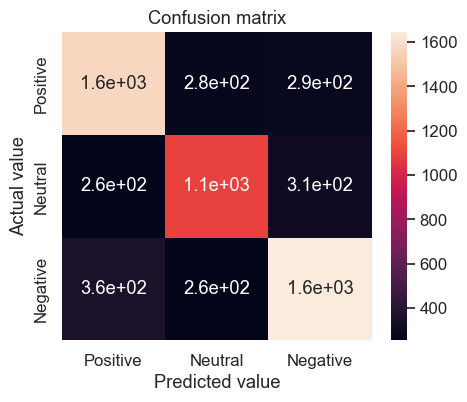

In [49]:
#train the model using multinomial naive byas
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

result=confusion_matrix(y_test,NB_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()


In [45]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
# defining parameter range
param_grid = {'alpha': [0.1, 0, 1.0, 10, 100,1000]} 
  
grid = GridSearchCV(MultinomialNB(), param_grid,refit = True, verbose = 3)
  
# fitting the model for grid search
grid.fit(x_train, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END .........................alpha=0.1;, score=0.645 total time=   0.0s
[CV 2/5] END .........................alpha=0.1;, score=0.639 total time=   0.0s
[CV 3/5] END .........................alpha=0.1;, score=0.637 total time=   0.0s
[CV 4/5] END .........................alpha=0.1;, score=0.648 total time=   0.0s
[CV 5/5] END .........................alpha=0.1;, score=0.631 total time=   0.0s
[CV 1/5] END ...........................alpha=0;, score=0.645 total time=   0.0s
[CV 2/5] END ...........................alpha=0;, score=0.639 total time=   0.0s
[CV 3/5] END ...........................alpha=0;, score=0.638 total time=   0.0s
[CV 4/5] END ...........................alpha=0;, score=0.649 total time=   0.0s
[CV 5/5] END ...........................alpha=0;, score=0.632 total time=   0.0s
[CV 1/5] END .........................alpha=1.0;, score=0.643 total time=   0.0s
[CV 2/5] END .........................alpha=1.0;,

GridSearchCV(estimator=MultinomialNB(),
             param_grid={'alpha': [0.1, 0, 1.0, 10, 100, 1000]}, verbose=3)

In [46]:
grid.best_params_

{'alpha': 0}

In [47]:
grid_predictions = grid.predict(x_test)
  
# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

    Negative       0.67      0.65      0.66      2364
     Neutral       0.52      0.56      0.54      1140
    Positive       0.69      0.68      0.69      2570

    accuracy                           0.65      6074
   macro avg       0.63      0.63      0.63      6074
weighted avg       0.65      0.65      0.65      6074



In [51]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeClassifier

# define models and parameters
model = RidgeClassifier()
alpha = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
# define grid search
grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

    
    
grid_predictions = grid_result.predict(x_test)
  
# print classification report
print(classification_report(y_test, grid_predictions))    

Best: 0.670051 using {'alpha': 1.0}
0.669759 (0.008682) with: {'alpha': 0.1}
0.669722 (0.008596) with: {'alpha': 0.2}
0.669740 (0.008500) with: {'alpha': 0.3}
0.669759 (0.008550) with: {'alpha': 0.4}
0.669850 (0.008632) with: {'alpha': 0.5}
0.669795 (0.008766) with: {'alpha': 0.6}
0.669923 (0.008764) with: {'alpha': 0.7}
0.669942 (0.008728) with: {'alpha': 0.8}
0.669942 (0.008712) with: {'alpha': 0.9}
0.670051 (0.008848) with: {'alpha': 1.0}
              precision    recall  f1-score   support

    Negative       0.67      0.69      0.68      2364
     Neutral       0.60      0.44      0.51      1140
    Positive       0.69      0.75      0.72      2570

    accuracy                           0.67      6074
   macro avg       0.65      0.63      0.64      6074
weighted avg       0.67      0.67      0.66      6074



In [52]:
# example of grid searching key hyperparametres for logistic regression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
grid_predictions = grid_result.predict(x_test)
  
# print classification report
print(classification_report(y_test, grid_predictions))        

Best: 0.689061 using {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.684231 (0.008856) with: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
0.683938 (0.008796) with: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
0.687396 (0.009023) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.684432 (0.009151) with: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
0.683993 (0.009297) with: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
0.687506 (0.009090) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.685585 (0.009205) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
0.685548 (0.009437) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
0.689061 (0.009103) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.687561 (0.009701) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
0.687561 (0.009708) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
0.680590 (0.009209) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.630349 (0.007877) wit

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
# define model and parameters
model = SVC()
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']
# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(x_train, y_train)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
grid_predictions = grid_result.predict(x_test)
  
# print classification report
print(classification_report(y_test, grid_predictions))     

Training accuracy Score    :  0.8421977056918601
Validation accuracy Score :  0.8294369443529799
              precision    recall  f1-score   support

    Negative       0.76      0.88      0.82      1851
     Neutral       0.92      0.74      0.82      2092
    Positive       0.82      0.87      0.85      2131

    accuracy                           0.83      6074
   macro avg       0.84      0.83      0.83      6074
weighted avg       0.84      0.83      0.83      6074



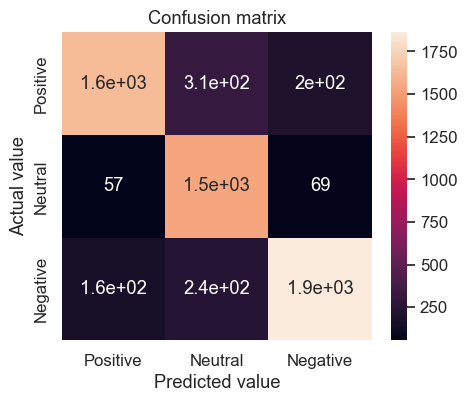

In [50]:
#train the model using SGD classifier
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

result=confusion_matrix(y_test,sgd_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.9984631428728251
Validation accuracy Score :  0.7994731643068818
              precision    recall  f1-score   support

    Negative       0.73      0.82      0.77      1928
     Neutral       0.88      0.75      0.81      1974
    Positive       0.80      0.83      0.82      2172

    accuracy                           0.80      6074
   macro avg       0.81      0.80      0.80      6074
weighted avg       0.81      0.80      0.80      6074



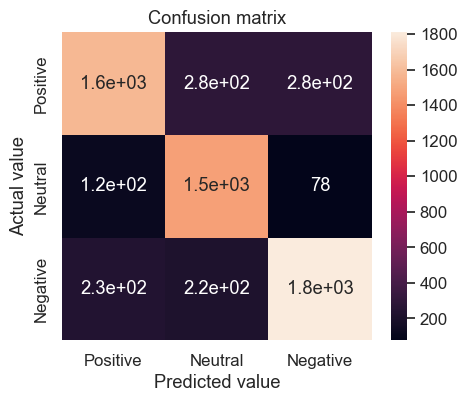

In [51]:
#train the model using random forest 
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier()

rf_clf.fit(x_train,y_train)

rf_prediction = rf_clf.predict(x_test)
rf_accuracy = accuracy_score(y_test,rf_prediction)
print("Training accuracy Score    : ",rf_clf.score(x_train,y_train))
print("Validation accuracy Score : ",rf_accuracy )
print(classification_report(rf_prediction,y_test))

result=confusion_matrix(y_test,rf_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

[18:20:21] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8579504912454031
Validation accuracy Score :  0.8187355943365163
              precision    recall  f1-score   support

    Negative       0.74      0.87      0.80      1806
     Neutral       0.94      0.73      0.82      2161
    Positive       0.81      0.86      0.83      2107

    accuracy                           0.82      6074
   macro avg       0.83      0.82      0.82      6074
weighted avg       0.83      0.82      0.82      6074



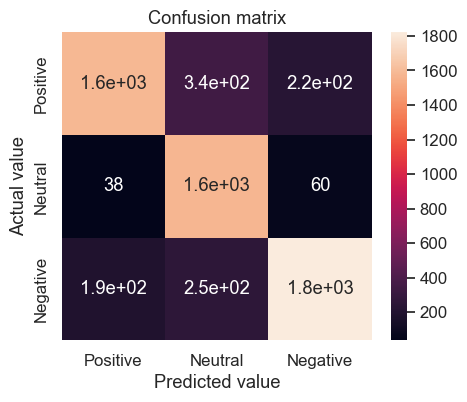

In [52]:
# train the model using xgb
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

result=confusion_matrix(y_test,xgb_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.9218947252867885
Validation accuracy Score :  0.7942048073756997
              precision    recall  f1-score   support

    Negative       0.75      0.82      0.78      1943
     Neutral       0.84      0.73      0.79      1917
    Positive       0.80      0.82      0.81      2214

    accuracy                           0.79      6074
   macro avg       0.80      0.79      0.79      6074
weighted avg       0.80      0.79      0.79      6074



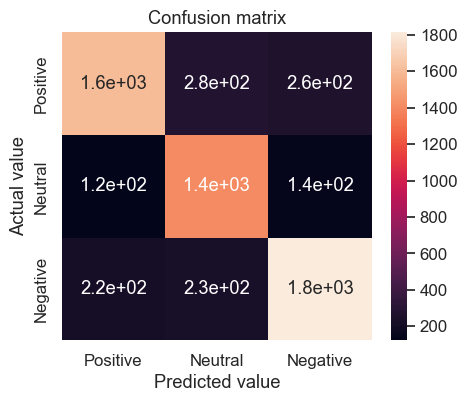

In [53]:
#train the model SVC
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

result=confusion_matrix(y_test,svc_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.8463142872825072
Validation accuracy Score :  0.8072110635495555
              precision    recall  f1-score   support

    Negative       0.77      0.83      0.80      1973
     Neutral       0.87      0.74      0.80      1960
    Positive       0.80      0.85      0.82      2141

    accuracy                           0.81      6074
   macro avg       0.81      0.81      0.81      6074
weighted avg       0.81      0.81      0.81      6074



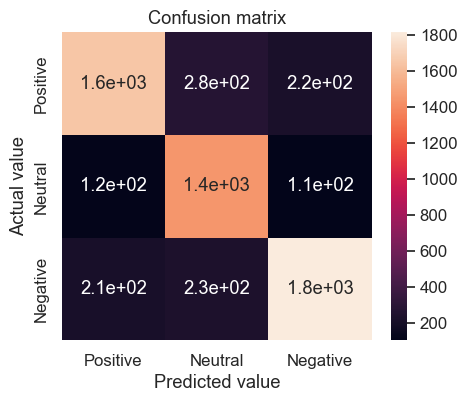

In [54]:
#train the model using logistic regression
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))
result=confusion_matrix(y_test,logreg_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()


Training accuracy Score    :  0.9984631428728251
Validation accuracy Score :  0.7216002634178466
              precision    recall  f1-score   support

    Negative       0.70      0.70      0.70      2149
     Neutral       0.73      0.73      0.73      1688
    Positive       0.73      0.74      0.73      2237

    accuracy                           0.72      6074
   macro avg       0.72      0.72      0.72      6074
weighted avg       0.72      0.72      0.72      6074



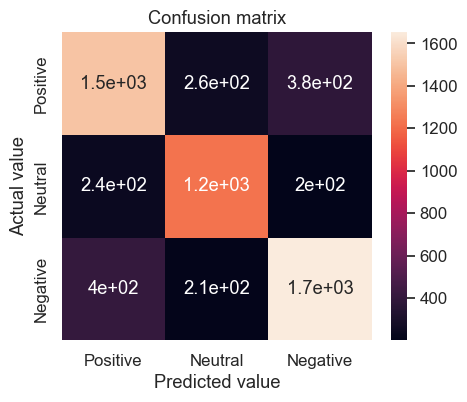

In [55]:
#train the model using decision tree classifier
from sklearn.tree import DecisionTreeClassifier
dct = DecisionTreeClassifier(criterion='entropy', random_state=1)
dct.fit(x_train,y_train);
dct_prediction=dct.predict(x_test)
dct_accuracy=accuracy_score(y_test,dct_prediction)
print("Training accuracy Score    : ",dct.score(x_train,y_train))
print("Validation accuracy Score : ",dct_accuracy )
print(classification_report(dct_prediction,y_test))
result=confusion_matrix(y_test,dct_prediction)

result=confusion_matrix(y_test,dct_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

,Model,Test accuracy
4,Stochastic Gradient Decent,0.829437
5,XGBoost,0.818736
1,Logistic Regression,0.807211
2,Random Forest,0.801943
0,Support Vector Machines,0.794205
6,Decision Tree,0.721600
3,Naive Bayes,0.711393


In [69]:
!pip install catboost
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension
from catboost import CatBoostClassifier, Pool, cv

     ---------------------------------------- 74.0/74.0 MB 1.1 MB/s eta 0:00:00
     -------------------------------------- 47.0/47.0 kB 782.9 kB/s eta 0:00:00


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [70]:
clf2 = CatBoostClassifier()


clf2.fit(x_train, y_train,  
        eval_set=(x_test, y_test), 
        verbose=False
)

print('CatBoost model is fitted: ' + str(clf2.is_fitted()))
print('CatBoost model parameters:')
print(clf2.get_params())

CatBoost model is fitted: True
CatBoost model parameters:
{}


In [71]:
catboost_prediction = clf2.predict(x_test)
catboost_accuracy = accuracy_score(y_test,catboost_prediction)
print("Training accuracy Score    : ",clf2.score(x_train,y_train))
print("Validation accuracy Score : ",catboost_accuracy )
print(classification_report(catboost_prediction,y_test))

Training accuracy Score    :  0.8457105219825457
Validation accuracy Score :  0.8221929535726046
              precision    recall  f1-score   support

    Negative       0.75      0.87      0.81      1858
     Neutral       0.93      0.74      0.82      2107
    Positive       0.81      0.87      0.84      2109

    accuracy                           0.82      6074
   macro avg       0.83      0.82      0.82      6074
weighted avg       0.83      0.82      0.82      6074



In [72]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','Decision Tree','Catboost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,dct_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

,Model,Test accuracy
4,Stochastic Gradient Decent,0.829437
7,Catboost,0.822193
5,XGBoost,0.818736
1,Logistic Regression,0.807211
2,Random Forest,0.801943
0,Support Vector Machines,0.794205
6,Decision Tree,0.721600
3,Naive Bayes,0.711393


In [56]:
##similar with congress based tweet
new_congress=congress_election[['full_text','sentiment_overall']]
new_congress.head()

,full_text,sentiment_overall
3,india icecream industri stand crore fastest g...,Neutral
7,multitud support across length breath bihar ca...,Positive
8,pappus lawyer repli court latest april d rep...,Neutral
9,ilhan omar made name one radic leftw member na...,Neutral
12,odisha bless mani river still struggl clean wa...,Positive


In [74]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_congress['full_text'])

In [76]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_congress['sentiment_overall'],random_state=42,stratify=new_congress['sentiment_overall'])

In [77]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(14915, 1000)
(4972, 1000)
(14915,)
(4972,)


In [78]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.7530003352329869
Validation accuracy Score :  0.7135961383748994
              precision    recall  f1-score   support

    Negative       0.71      0.72      0.71      1746
     Neutral       0.73      0.70      0.71      1553
    Positive       0.70      0.72      0.71      1673

    accuracy                           0.71      4972
   macro avg       0.71      0.71      0.71      4972
weighted avg       0.71      0.71      0.71      4972



In [79]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.8280925243043915
Validation accuracy Score :  0.8143604183427192
              precision    recall  f1-score   support

    Negative       0.74      0.87      0.80      1502
     Neutral       0.94      0.74      0.82      1890
    Positive       0.78      0.85      0.81      1580

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.82      4972



In [80]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier()

rf_clf.fit(x_train,y_train)

rf_prediction = rf_clf.predict(x_test)
rf_accuracy = accuracy_score(y_test,rf_prediction)
print("Training accuracy Score    : ",rf_clf.score(x_train,y_train))
print("Validation accuracy Score : ",rf_accuracy )
print(classification_report(rf_prediction,y_test))

Training accuracy Score    :  0.9981897418706001
Validation accuracy Score :  0.7998793242156074
              precision    recall  f1-score   support

    Negative       0.72      0.85      0.78      1496
     Neutral       0.92      0.75      0.82      1817
    Positive       0.78      0.81      0.80      1659

    accuracy                           0.80      4972
   macro avg       0.81      0.80      0.80      4972
weighted avg       0.81      0.80      0.80      4972



In [81]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:20:00] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8406302380154207
Validation accuracy Score :  0.8077232502011263
              precision    recall  f1-score   support

    Negative       0.72      0.88      0.79      1440
     Neutral       0.96      0.72      0.82      1966
    Positive       0.77      0.84      0.80      1566

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.81      4972



In [82]:
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9145826349312772
Validation accuracy Score :  0.7614641995172968
              precision    recall  f1-score   support

    Negative       0.71      0.79      0.75      1573
     Neutral       0.84      0.72      0.78      1734
    Positive       0.75      0.77      0.76      1665

    accuracy                           0.76      4972
   macro avg       0.77      0.76      0.76      4972
weighted avg       0.77      0.76      0.76      4972



In [83]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.8342608112638283
Validation accuracy Score :  0.7829847144006437
              precision    recall  f1-score   support

    Negative       0.73      0.82      0.77      1575
     Neutral       0.88      0.73      0.80      1804
    Positive       0.75      0.81      0.78      1593

    accuracy                           0.78      4972
   macro avg       0.79      0.79      0.78      4972
weighted avg       0.79      0.78      0.78      4972



In [84]:
clf2 = CatBoostClassifier()


clf2.fit(x_train, y_train,  
        eval_set=(x_test, y_test), 
        verbose=False
)

print('CatBoost model is fitted: ' + str(clf2.is_fitted()))
print('CatBoost model parameters:')
print(clf2.get_params())

CatBoost model is fitted: True
CatBoost model parameters:
{}


In [85]:
catboost_prediction = clf2.predict(x_test)
catboost_accuracy = accuracy_score(y_test,catboost_prediction)
print("Training accuracy Score    : ",clf2.score(x_train,y_train))
print("Validation accuracy Score : ",catboost_accuracy )
print(classification_report(catboost_prediction,y_test))

Training accuracy Score    :  0.8319141803553469
Validation accuracy Score :  0.8105390185036203
              precision    recall  f1-score   support

    Negative       0.73      0.87      0.80      1485
     Neutral       0.94      0.73      0.82      1920
    Positive       0.77      0.85      0.81      1567

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.81      4972



In [86]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','CatBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

,Model,Test accuracy
4,Stochastic Gradient Decent,0.814360
6,CatBoost,0.810539
5,XGBoost,0.807723
2,Random Forest,0.799879
1,Logistic Regression,0.782985
0,Support Vector Machines,0.761464
3,Naive Bayes,0.713596


In [87]:
freq=nltk.FreqDist(bjp_election['hashtags'])

d=pd.DataFrame({'HashTags':list(freq.keys()),
               'Count':list(freq.values())})

d.head()

,HashTags,Count
0,ActEast,1
1,,18797
2,BCCIBetraysBraves,1
3,"EveryVoteForModi,ModiOnceMore",1
4,"Pakistan,India",1


In [124]:
##creating a model which predict the subject of tweet
new_data=df[['full_text','subject']]
new_data.head()

,full_text,subject
0,guwahati gain lot promin recent year due pm sh...,Bjp
1,rss school day indoctrin sinc childhood thrice...,Bjp
2,word dont exist vaccummodi post pulwama word g...,Bjp
3,india icecream industri stand crore fastest g...,Congress
4,crpf jawan kill pulwama attackiaf strike paki...,Bjp


In [125]:
x=new_data[['full_text']]
y=new_data[['subject']]
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_data['full_text'])

In [126]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,y,random_state=42)

In [129]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.9708676010656783
Validation accuracy Score :  0.9605594648596995
                    precision    recall  f1-score   support

               Bjp       0.98      0.95      0.97      6302
          Congress       0.95      0.97      0.96      4817
            Others       0.81      0.94      0.87       392
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.96     11511
         macro avg       0.68      0.72      0.70     11511
      weighted avg       0.96      0.96      0.96     11511



In [46]:
from sklearn.ensemble import RandomForestClassifier
rmf=RandomForestClassifier(max_depth=18,random_state=0)
rmf_clf=rmf.fit(x_train,y_train)

rmf_prediction = rmf.predict(x_test)
rmf_accuracy = accuracy_score(y_test,rmf_prediction)
print("Training accuracy Score    : ",rmf.score(x_train,y_train))
print("Validation accuracy Score : ",rmf_accuracy )
print(classification_report(rmf_prediction,y_test))

Training accuracy Score    :  0.9605004054210587
Validation accuracy Score :  0.9530883502736512
                    precision    recall  f1-score   support

               Bjp       0.99      0.93      0.96      6567
          Congress       0.93      0.99      0.96      4646
            Others       0.65      1.00      0.79       298
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.95     11511
         macro avg       0.64      0.73      0.68     11511
      weighted avg       0.96      0.95      0.95     11511



In [47]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.9201899687246612
Validation accuracy Score :  0.9179914864043089
                    precision    recall  f1-score   support

               Bjp       0.95      0.92      0.93      6315
          Congress       0.89      0.95      0.92      4606
            Others       0.83      0.64      0.72       590
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.92     11511
         macro avg       0.67      0.63      0.64     11511
      weighted avg       0.92      0.92      0.92     11511



In [17]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9795551951812811
Validation accuracy Score :  0.9614281991138911
                    precision    recall  f1-score   support

               Bjp       0.99      0.94      0.97      6418
          Congress       0.95      0.98      0.96      4755
            Others       0.74      1.00      0.85       338
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.96     11511
         macro avg       0.67      0.73      0.70     11511
      weighted avg       0.96      0.96      0.96     11511



In [18]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.9653364994787443
Validation accuracy Score :  0.9609069585613761
                    precision    recall  f1-score   support

               Bjp       0.98      0.95      0.96      6336
          Congress       0.95      0.97      0.96      4816
            Others       0.78      1.00      0.87       354
          ['govt']       0.00      0.00      0.00         1
['not', 'instead']       0.00      0.00      0.00         0
           ['now']       0.00      0.00      0.00         4

          accuracy                           0.96     11511
         macro avg       0.45      0.49      0.47     11511
      weighted avg       0.96      0.96      0.96     11511



In [19]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:35:10] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.9770068342407042
Validation accuracy Score :  0.9700286682303884
                    precision    recall  f1-score   support

               Bjp       0.99      0.96      0.97      6317
          Congress       0.96      0.98      0.97      4820
            Others       0.81      0.99      0.89       374
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.97     11511
         macro avg       0.69      0.73      0.71     11511
      weighted avg       0.97      0.97      0.97     11511



In [104]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','CatBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

NameError: name 'svc_accuracy' is not defined

In [55]:
#create the model for senmtiment ie pos,neg,neu
new_data=df[['full_text']]
import nltk

In [56]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
new_data['sentiment'] = new_data['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

new_data['sentiment_overall'] = new_data['sentiment'].apply(lambda x: sentimentVerdict(x))

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [57]:
new_data.head()

,full_text,sentiment,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive
1,rss school day indoctrin sinc childhood thrice...,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative
2,word dont exist vaccummodi post pulwama word g...,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative
3,india icecream industri stand crore fastest g...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative


In [58]:
new_data=new_data[['full_text','sentiment_overall']]
new_data.head()

,full_text,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,Positive
1,rss school day indoctrin sinc childhood thrice...,Negative
2,word dont exist vaccummodi post pulwama word g...,Negative
3,india icecream industri stand crore fastest g...,Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,Negative


In [61]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_data['full_text'])

In [62]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_data['sentiment_overall'],random_state=42)

In [63]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.8204563882775396
Validation accuracy Score :  0.800625488663018
              precision    recall  f1-score   support

    Negative       0.75      0.85      0.80      3482
     Neutral       0.91      0.71      0.80      4067
    Positive       0.77      0.85      0.81      3962

    accuracy                           0.80     11511
   macro avg       0.81      0.80      0.80     11511
weighted avg       0.81      0.80      0.80     11511



In [64]:
from sklearn.ensemble import RandomForestClassifier
rmf=RandomForestClassifier(max_depth=18,random_state=0)
rmf_clf=rmf.fit(x_train,y_train)

rmf_prediction = rmf.predict(x_test)
rmf_accuracy = accuracy_score(y_test,rmf_prediction)
print("Training accuracy Score    : ",rmf.score(x_train,y_train))
print("Validation accuracy Score : ",rmf_accuracy )
print(classification_report(rmf_prediction,y_test))

Training accuracy Score    :  0.7667960152901656
Validation accuracy Score :  0.72973677352098
              precision    recall  f1-score   support

    Negative       0.61      0.86      0.72      2822
     Neutral       0.84      0.63      0.72      4218
    Positive       0.75      0.74      0.75      4471

    accuracy                           0.73     11511
   macro avg       0.74      0.74      0.73     11511
weighted avg       0.75      0.73      0.73     11511



In [33]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:59:45] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8477064751534809
Validation accuracy Score :  0.8140908696029885
              precision    recall  f1-score   support

    Negative       0.73      0.88      0.80      3295
     Neutral       0.95      0.72      0.82      4145
    Positive       0.80      0.86      0.83      4071

    accuracy                           0.81     11511
   macro avg       0.82      0.82      0.81     11511
weighted avg       0.83      0.81      0.81     11511



In [34]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.8351094636858566
Validation accuracy Score :  0.8259056554599948
              precision    recall  f1-score   support

    Negative       0.75      0.88      0.81      3375
     Neutral       0.95      0.73      0.83      4076
    Positive       0.81      0.88      0.84      4060

    accuracy                           0.83     11511
   macro avg       0.83      0.83      0.83     11511
weighted avg       0.84      0.83      0.83     11511



In [19]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
svc = SVC()
svc.fit(x_train, y_train)
svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9091277655507934
Validation accuracy Score :  0.8062722613152636
              precision    recall  f1-score   support

    Negative       0.74      0.85      0.79      3444
     Neutral       0.90      0.74      0.81      3834
    Positive       0.80      0.83      0.82      4233

    accuracy                           0.81     11511
   macro avg       0.81      0.81      0.81     11511
weighted avg       0.81      0.81      0.81     11511



In [20]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()
naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.7455403683539905
Validation accuracy Score :  0.7200938232994527
              precision    recall  f1-score   support

    Negative       0.72      0.74      0.73      3864
     Neutral       0.69      0.68      0.69      3227
    Positive       0.74      0.74      0.74      4420

    accuracy                           0.72     11511
   macro avg       0.72      0.72      0.72     11511
weighted avg       0.72      0.72      0.72     11511



In [ ]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

In [32]:
from keras.preprocessing.text import one_hot,Tokenizer
from tensorflow.keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers.core import Activation, Dropout, Dense
from keras.layers import Flatten, GlobalMaxPooling1D, Embedding, Conv1D, LSTM
from sklearn.model_selection import train_test_split

In [60]:
##create a model whcih classify pos and neg tweet using simple neural network
x=[]
sentences=list(new_data['full_text'])
for sen in sentences:
    x.append(sen)
y=new_data['sentiment_overall']
y=y.map({'Positive':1,'Negative':0,'Neutral':1})

0    1
1    0
2    0
3    1
4    0
Name: sentiment_overall, dtype: int64

In [67]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

In [68]:
word_tokenizer=Tokenizer()
word_tokenizer.fit_on_texts(X_train)

X_train=word_tokenizer.texts_to_sequences(X_train)
X_test=word_tokenizer.texts_to_sequences(X_test)

In [69]:
vocab_length=len(word_tokenizer.word_index)+1

vocab_length

69862

In [70]:
maxlen=100

X_train=pad_sequences(X_train,padding='post',maxlen=maxlen)
X_test=pad_sequences(X_test,padding='post',maxlen=maxlen)

In [71]:
from numpy import asarray
from numpy import zeros

embeddings_dictionary=dict()
glove_file=open('a2_glove.6B.100d.txt',encoding="utf8")

for line in glove_file:
    records=line.split()
    word=records[0]
    vector_dimensions=asarray(records[1:],dtype='float32')
    embeddings_dictionary[word]=vector_dimensions
    
glove_file.close() 

In [72]:
embedding_matrix = zeros((vocab_length, 100))
for word, index in word_tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [73]:
embedding_matrix.shape

(69862, 100)

In [74]:
snn_model = Sequential()
embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)

snn_model.add(embedding_layer)

snn_model.add(Flatten())
snn_model.add(Dense(1, activation='sigmoid'))

In [75]:
snn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

print(snn_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 100)          6986200   
                                                                 
 flatten (Flatten)           (None, 10000)             0         
                                                                 
 dense (Dense)               (None, 1)                 10001     
                                                                 
Total params: 6,996,201
Trainable params: 10,001
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [86]:
snn_model_history = snn_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)

Epoch 1/6
231/231 [==============================] - 2s 5ms/step - loss: 0.5749 - acc: 0.7129 - val_loss: 0.5273 - val_acc: 0.7515
Epoch 2/6
231/231 [==============================] - 1s 5ms/step - loss: 0.5054 - acc: 0.7653 - val_loss: 0.5093 - val_acc: 0.7584
Epoch 3/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4816 - acc: 0.7798 - val_loss: 0.5003 - val_acc: 0.7673
Epoch 4/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4674 - acc: 0.7866 - val_loss: 0.4974 - val_acc: 0.7656
Epoch 5/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4581 - acc: 0.7924 - val_loss: 0.4973 - val_acc: 0.7672
Epoch 6/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4508 - acc: 0.7955 - val_loss: 0.4986 - val_acc: 0.7686


In [87]:
score = snn_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 1s 2ms/step - loss: 0.5100 - acc: 0.7634


In [88]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.5099710822105408
Test Accuracy: 0.7633836269378662


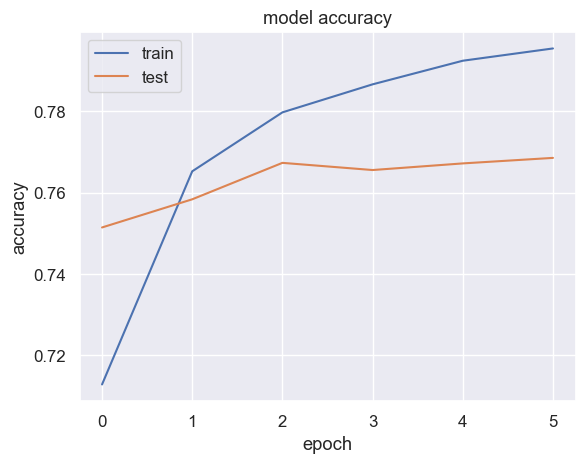

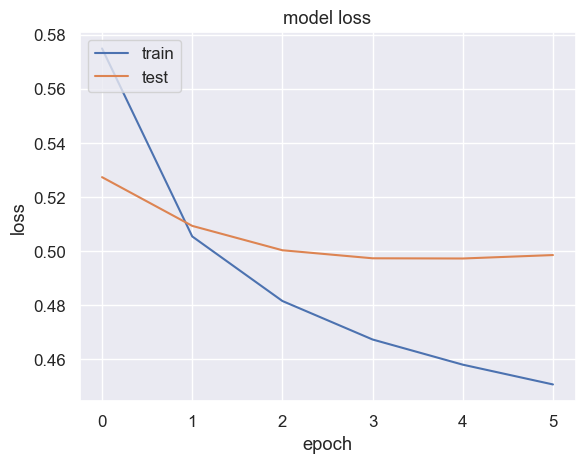

In [89]:
import matplotlib.pyplot as plt

plt.plot(snn_model_history.history['acc'])
plt.plot(snn_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(snn_model_history.history['loss'])
plt.plot(snn_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()


In [90]:
from keras.layers import Conv1D

In [91]:
#create a model using cnn 
cnn_model = Sequential()

embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)
cnn_model.add(embedding_layer)

cnn_model.add(Conv1D(128, 5, activation='relu'))
cnn_model.add(GlobalMaxPooling1D())
cnn_model.add(Dense(1, activation='sigmoid'))

In [92]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
print(cnn_model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 100)          6986200   
                                                                 
 conv1d (Conv1D)             (None, 96, 128)           64128     
                                                                 
 global_max_pooling1d (Globa  (None, 128)              0         
 lMaxPooling1D)                                                  
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 7,050,457
Trainable params: 64,257
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [93]:
cnn_model_history=cnn_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)

Epoch 1/6
231/231 [==============================] - 9s 37ms/step - loss: 0.4707 - acc: 0.7751 - val_loss: 0.4258 - val_acc: 0.8007
Epoch 2/6
231/231 [==============================] - 8s 37ms/step - loss: 0.3530 - acc: 0.8473 - val_loss: 0.3738 - val_acc: 0.8320
Epoch 3/6
231/231 [==============================] - 8s 37ms/step - loss: 0.2880 - acc: 0.8843 - val_loss: 0.3480 - val_acc: 0.8476
Epoch 4/6
231/231 [==============================] - 10s 45ms/step - loss: 0.2365 - acc: 0.9127 - val_loss: 0.3310 - val_acc: 0.8599
Epoch 5/6
231/231 [==============================] - 11s 49ms/step - loss: 0.1922 - acc: 0.9369 - val_loss: 0.3308 - val_acc: 0.8639
Epoch 6/6
231/231 [==============================] - 11s 49ms/step - loss: 0.1549 - acc: 0.9549 - val_loss: 0.3346 - val_acc: 0.8630


In [94]:
score = cnn_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 1s 5ms/step - loss: 0.3512 - acc: 0.8535


In [95]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.35119864344596863
Test Accuracy: 0.8535128831863403


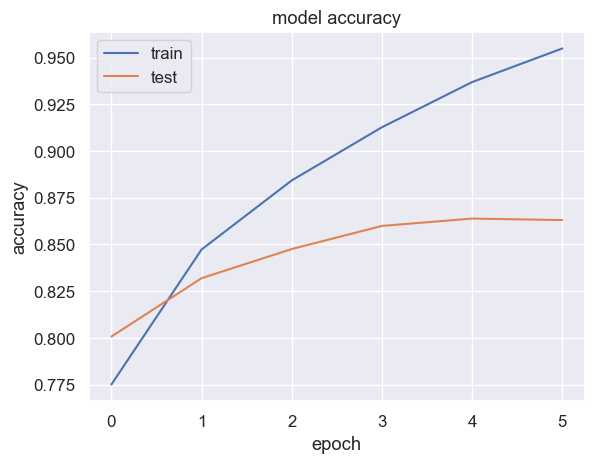

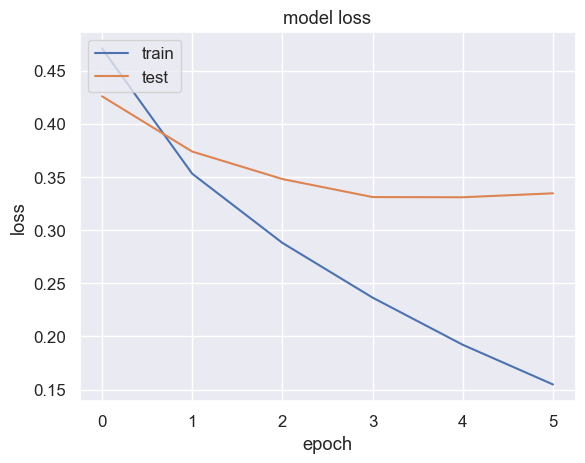

In [96]:
import matplotlib.pyplot as plt

plt.plot(cnn_model_history.history['acc'])
plt.plot(cnn_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc = 'upper left')
plt.show()

plt.plot(cnn_model_history.history['loss'])
plt.plot(cnn_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc = 'upper left')
plt.show()

In [97]:
from keras.layers import LSTM

In [98]:
#create a model using lstm
lstm_model = Sequential()
embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)

lstm_model.add(embedding_layer)
lstm_model.add(LSTM(128))

lstm_model.add(Dense(1, activation='sigmoid'))

In [99]:
lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
print(lstm_model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 100)          6986200   
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                                                 
Total params: 7,103,577
Trainable params: 117,377
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [100]:
lstm_model_history = lstm_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)


Epoch 1/6
231/231 [==============================] - 39s 159ms/step - loss: 0.6518 - acc: 0.6513 - val_loss: 0.6473 - val_acc: 0.6521
Epoch 2/6
231/231 [==============================] - 38s 164ms/step - loss: 0.6468 - acc: 0.6519 - val_loss: 0.6466 - val_acc: 0.6521
Epoch 3/6
231/231 [==============================] - 40s 175ms/step - loss: 0.6464 - acc: 0.6519 - val_loss: 0.6485 - val_acc: 0.6521
Epoch 4/6
231/231 [==============================] - 49s 213ms/step - loss: 0.6467 - acc: 0.6519 - val_loss: 0.6476 - val_acc: 0.6521
Epoch 5/6
231/231 [==============================] - 48s 208ms/step - loss: 0.6466 - acc: 0.6519 - val_loss: 0.6466 - val_acc: 0.6521
Epoch 6/6
231/231 [==============================] - 48s 208ms/step - loss: 0.6465 - acc: 0.6519 - val_loss: 0.6462 - val_acc: 0.6521


In [101]:
score = lstm_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 8s 26ms/step - loss: 0.6422 - acc: 0.6586


In [102]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.6422088146209717
Test Accuracy: 0.6585948467254639


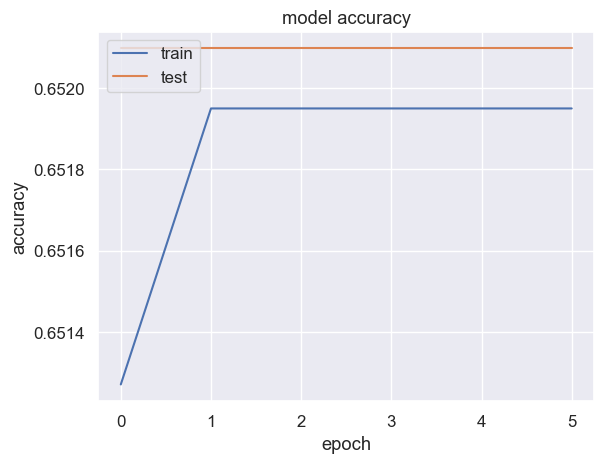

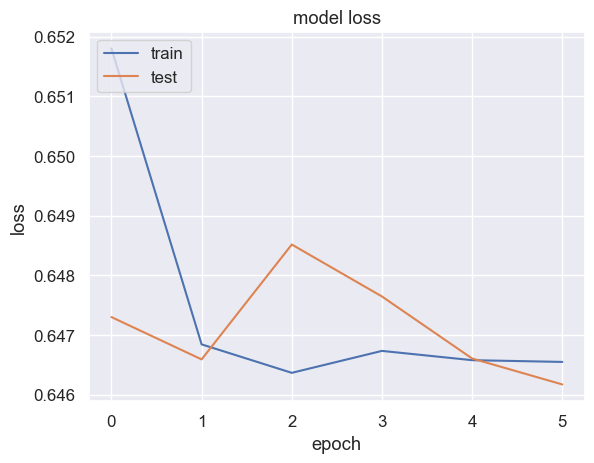

In [103]:
import matplotlib.pyplot as plt

plt.plot(lstm_model_history.history['acc'])
plt.plot(lstm_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(lstm_model_history.history['loss'])
plt.plot(lstm_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

In [56]:
#create a model which predict pos , neg, neu using LSTM
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(new_data['full_text'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 81676 unique tokens.


In [57]:
X = tokenizer.texts_to_sequences(new_data['full_text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (46043, 250)


In [58]:
Y = pd.get_dummies(new_data['sentiment_overall']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (46043, 3)


In [59]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.10, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(41438, 250) (41438, 3)
(4605, 250) (4605, 3)


In [60]:
from tensorflow.keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 250, 100)          5000000   
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 250, 100)         0         
 lDropout1D)                                                     
                                                                 
 lstm_1 (LSTM)               (None, 100)               80400     
                                                                 
 dense_1 (Dense)             (None, 3)                 303       
                                                                 
Total params: 5,080,703
Trainable params: 5,080,703
Non-trainable params: 0
_________________________________________________________________
None


In [61]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
epochs = 5
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/5
307/583 [==============>...............] - ETA: 4:18 - loss: 0.7464 - accuracy: 0.6607

KeyboardInterrupt: 

In [82]:
##evaluate the model 
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))
     

144/144 [==============================] - 12s 82ms/step - loss: 0.3807 - accuracy: 0.8975
Test set
  Loss: 0.381
  Accuracy: 0.898


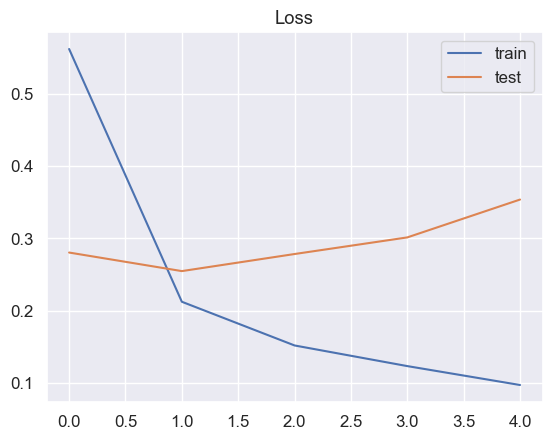

In [83]:
#plot the loss diagram
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

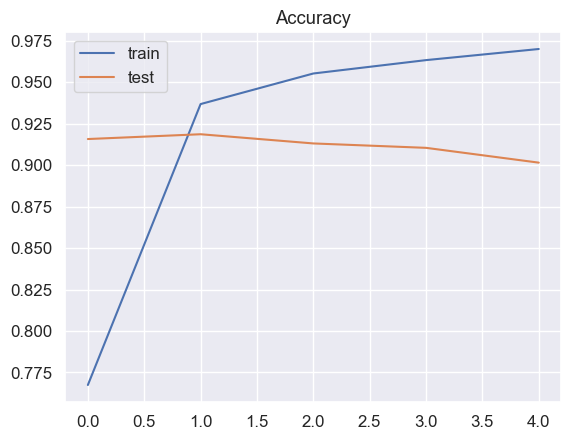

In [84]:
#plot the accuracy diagram
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.show();

In [33]:
test=pd.read_csv('All_Text_Output.csv')
test.head()

,Text OUTPUT
0,"['ANI', '@ANI', 'Telangana: Hyderabad', 'Polic..."
1,"['Whole bollywood; Left ecosystem', 'Is after ..."
2,"['Meerut: Man changes identity to trap', 'Ghaz..."
3,['Boss is back in buisness']
4,"['Sharjil Imam tested Positive', 'for Coronavi..."


In [42]:
text=['@Itrallpallbics RSS people attacked My home today No; didnt Mat maan Tu mat maan They']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Positive', 'Negative', 'Neural']
print(pred, labels[np.argmax(pred)])
     

1/1 [==============================] - 0s 52ms/step
[[0.40518668 0.06456624 0.5302471 ]] Neural


In [41]:
text=['ANI @ANI Telangana: Hyderabad Police has arrested a man for posing as a COVID-19 recovered patient and cheating people in the guise of donating plasma and supplying antivira medicine @ibrollja814.761&arra3cF City']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Positive', 'Negative', 'Neural']
print(pred, labels[np.argmax(pred)])
     

1/1 [==============================] - 0s 52ms/step
[[0.03525466 0.95142114 0.01332409]] Negative


In [22]:
#create a model
new_data=df[['full_text','hashtags','subject']]
new_data.head()

,full_text,hashtags,subject
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp
1,rss school day indoctrin sinc childhood thrice...,,Bjp
2,word dont exist vaccummodi post pulwama word g...,,Bjp
3,india icecream industri stand crore fastest g...,Icecream,Congress
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp


In [23]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
new_data['sentiment'] = new_data['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

new_data['sentiment_overall'] = new_data['sentiment'].apply(lambda x: sentimentVerdict(x))

[nltk_data] Error loading vader_lexicon: <urlopen error [WinError
[nltk_data]     10054] An existing connection was forcibly closed by
[nltk_data]     the remote host>


In [24]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative


In [25]:
new_data.drop(['sentiment'], axis=1)

,full_text,hashtags,subject,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,Negative
...,...,...,...,...
46038,articl today bspsp combin firm plan take bjp ...,,Bjp,Neutral
46039,noida homebuy like antrikshsanskr ghaziabad ...,"Noida,homebuyers,AntrikshSanskriti,Ghaziabad",Bjp,Positive
46040,modi noth last yrs speach fill lie power abso...,,Bjp,Neutral
46041,congress turn heat white hous answer journalis...,,Congress,Negative


In [26]:
new_data['total_sentiment']=new_data['subject'] + ' ' + new_data['sentiment_overall'].astype(str)
new_data['total_sentiment']

0             Bjp Positive
1             Bjp Negative
2             Bjp Negative
3         Congress Neutral
4             Bjp Negative
               ...        
46038          Bjp Neutral
46039         Bjp Positive
46040          Bjp Neutral
46041    Congress Negative
46042    Congress Negative
Name: total_sentiment, Length: 46043, dtype: object

In [27]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive,Bjp Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative,Bjp Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative,Bjp Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral,Congress Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative,Bjp Negative


In [28]:
def processsentiment(sentiment):
  if sentiment =='Bjp Positive':
    return "Bjp_Positive"
  elif sentiment =='Bjp Negative':
    return "Bjp_Negative"
  elif sentiment =='Bjp Neutral':
    return "Bjp_Neutral"
  elif sentiment =='Congress Positive':
    return "Congress_Positive"
  elif sentiment =='Congress Negative':
    return "Congress_Negative"
  elif sentiment =='Congress Neutral':
    return "Congress_Neutral"    
  elif sentiment==' Positive':
    return "Others_Positive"
  elif sentiment=='[] Neutral' or sentiment=="['not','instead'] Neutral" or sentiment ==' Neutral' or sentiment=="['govt'] Neutral" or sentiment=="['now'] Neutral":
    return "Others_Neutral"
  elif sentiment == ' Negative':
    return "Others_Negative"
  

new_data['total_sentiment'] = new_data['total_sentiment'].apply(lambda x: processsentiment(x))

In [29]:
new_data.total_sentiment.unique()

array(['Bjp_Positive', 'Bjp_Negative', 'Congress_Neutral',
       'Congress_Positive', 'Bjp_Neutral', 'Congress_Negative', None,
       'Others_Positive', 'Others_Neutral', 'Others_Negative'],
      dtype=object)

In [30]:
new_data=new_data[['full_text','total_sentiment']]
new_data.head()

,full_text,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,Bjp_Positive
1,rss school day indoctrin sinc childhood thrice...,Bjp_Negative
2,word dont exist vaccummodi post pulwama word g...,Bjp_Negative
3,india icecream industri stand crore fastest g...,Congress_Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,Bjp_Negative


In [33]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(new_data['full_text'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 81676 unique tokens.


In [34]:
X = tokenizer.texts_to_sequences(new_data['full_text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (46043, 250)


In [35]:
Y = pd.get_dummies(new_data['total_sentiment']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (46043, 9)


In [36]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.10, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(41438, 250) (41438, 9)
(4605, 250) (4605, 9)


In [37]:
from tensorflow.keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(9, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 250, 100)          5000000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 250, 100)         0         
 ropout1D)                                                       
                                                                 
 lstm (LSTM)                 (None, 100)               80400     
                                                                 
 dense (Dense)               (None, 9)                 909       
                                                                 
Total params: 5,081,309
Trainable params: 5,081,309
Non-trainable params: 0
_________________________________________________________________
None


In [34]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
epochs = 5
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/5
583/583 [==============================] - 649s 1s/step - loss: 1.0037 - accuracy: 0.5659 - val_loss: 0.4983 - val_accuracy: 0.8164
Epoch 2/5
583/583 [==============================] - 757s 1s/step - loss: 0.3717 - accuracy: 0.8641 - val_loss: 0.3965 - val_accuracy: 0.8542
Epoch 3/5
583/583 [==============================] - 1500s 3s/step - loss: 0.2546 - accuracy: 0.9045 - val_loss: 0.4159 - val_accuracy: 0.8617
Epoch 4/5
583/583 [==============================] - 3443s 6s/step - loss: 0.1943 - accuracy: 0.9300 - val_loss: 0.4385 - val_accuracy: 0.8547
Epoch 5/5
583/583 [==============================] - 628s 1s/step - loss: 0.1610 - accuracy: 0.9336 - val_loss: 0.4209 - val_accuracy: 0.8427


In [42]:
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

144/144 [==============================] - 15s 103ms/step - loss: 0.4317 - accuracy: 0.8423
Test set
  Loss: 0.432
  Accuracy: 0.842


In [ ]:
model.save('models/save_model')

In [38]:
from tensorflow.keras.models import load_model
loaded_model=load_model('model')

In [39]:
loaded_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 250, 100)          5000000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 250, 100)         0         
 ropout1D)                                                       
                                                                 
 lstm (LSTM)                 (None, 100)               80400     
                                                                 
 dense (Dense)               (None, 9)                 909       
                                                                 
Total params: 5,081,309
Trainable params: 5,081,309
Non-trainable params: 0
_________________________________________________________________


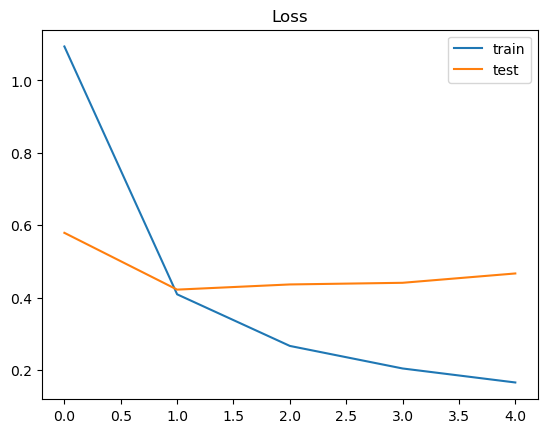

In [42]:
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

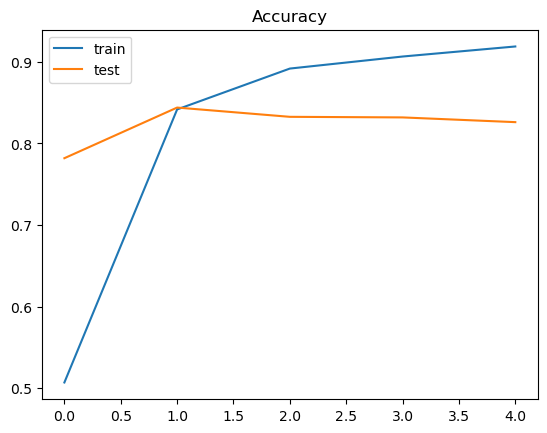

In [43]:
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.show();

In [35]:
df_data=pd.read_csv('text_output_2.csv')
df_data.head()

,Text OUTPUT
0,BJP Gujarat\t @BJPAGujarat\t The weather was n...
1,Wnnon\t 'PM Modi was right when he\t said_\t M...
2,"SOTHEN ] WAS LIKE I DONT WANNA 'RUSSIA""\t BUT ..."
3,REd\t FOHESRAEBAYSOBIBUTE\t HEERABEN MODI
4,"HW\t ""IN MODI'S RULE,\t ONLY AIR IS FREE"""


In [36]:
df_data["Text OUTPUT"] = df_data["Text OUTPUT"].apply(clean)
df_data['Text OUTPUT'] = df_data['Text OUTPUT'].str.replace('\t', '')
df_data['Text OUTPUT'].apply(clean)
df_data.head()

,Text OUTPUT
0,bjp gujarat bjpagujarat weather good onthe air...
1,wnnon pm modi right he said messag to russiau...
2,sothen like dont wanna russia vou putin somel...
3,red fohesraebaysobibute heeraben modi
4,hw modi rule air free


In [37]:
y_test=pd.read_csv('sentiment - Sheet1 (1).csv')
y_test.head()

,Sentiment
0,Bjp Negative
1,Bjp Positive
2,Bjp Negative
3,Bjp Negative
4,Bjp Positive


In [38]:
tokenizer.fit_on_texts(df_data['Text OUTPUT'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 83240 unique tokens.


In [39]:
X = tokenizer.texts_to_sequences(df_data['Text OUTPUT'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (298, 250)


In [40]:
Y = pd.get_dummies(y_test['Sentiment']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (298, 9)


In [41]:
accr = model.evaluate(X,Y)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

10/10 [==============================] - 1s 67ms/step - loss: 4.3638 - accuracy: 0.2819
Test set
  Loss: 4.364
  Accuracy: 0.282


In [41]:
text=['Rafale deal back to haunt modi govt?']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 1s 1s/step
[[9.95460093e-01 2.99037015e-03 8.19804554e-04 6.70615176e-04
  1.17901418e-05 2.29346620e-06 1.80107672e-05 1.02338445e-05
  1.67965936e-05]] Bjp Positive


In [42]:
text=['rare pic of Modi and Amit shah during 2002 Gujarat riots:']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Cngress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 43ms/step
[[5.4804387e-04 9.9932933e-01 1.0626266e-04 6.6486969e-08 9.4901916e-06
  1.9729303e-08 1.3693624e-07 6.1514274e-06 6.3683234e-07]] Bjp Negative


In [43]:
text=['LIVE NOW: PM MODI SUBMITS NOMINATION PAPERS']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 39ms/step
[[1.7620927e-03 9.9624157e-01 1.0328169e-03 4.1895555e-06 3.5113431e-04
  4.1173516e-06 6.9517264e-06 5.7775772e-04 1.9347181e-05]] Bjp Negative


In [44]:
text=['"I CAN GO BACK & OPEN A TEA STALL-NARENDRA MODI !L CHECK THESE REACTIONS']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 255ms/step
[[0.11050753 0.11215206 0.1109654  0.11157084 0.1093109  0.11108719
  0.11260404 0.11005361 0.1117484 ]] Other Positive


In [46]:
text=['TOPJOKE OF THEDAY Rahul GANDHI Says He CANT coMpetE With ModiIN Lving BEcAUSE HE succrsruily achiewet Making gold From ALoo, ThREW Out CHINA FROM INDIAN LAND IN 1SMINS ,GAVE 75000 ALLINDUANS nd Gorrarae FOR JusT crore EOS WHAT SHOULD WE CALL TheSE STATEMENTS OF RAHUL GANDHI']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 39ms/step
[[3.1944815e-04 6.5666318e-06 5.6586528e-06 9.8183757e-01 7.7786790e-03
  1.0012665e-02 3.6744539e-05 2.3553705e-06 3.8826812e-07]] Congress Positive


In [44]:
text=['CHOWKIDAR CHOR HA']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 42ms/step
[[4.3509612e-03 2.1292087e-01 7.5743872e-01 1.6423127e-04 2.5822930e-03
  1.9568956e-02 1.0805524e-05 2.2723074e-03 6.9073163e-04]] Bjp Neural


In [42]:
text=['Prern? Bakshi = Opbema Dear @narendramodi Jus: wanted Say fuck you']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 43ms/step
[[9.8071986e-01 5.2573858e-03 1.3295904e-02 2.2193075e-04 5.3064400e-06
  1.2525636e-05 1.0236941e-05 6.5915883e-06 4.7035460e-04]] Bjp Positive


In [40]:
text=['Narendra Modi @narendramodi This Sunday, thinking ofgiving up my social media accounts on Facebook; Twitter; Instagram & YouTube: Will keepyou all posted.']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 41ms/step
[[1.1675095e-03 9.9308276e-01 3.2060724e-03 6.9941661e-06 2.4006236e-03
  1.5822952e-05 4.4279486e-06 1.0542496e-04 1.0254213e-05]] Bjp Negative


In [38]:
text=['SOTHEN ] WAS LIKE I DONT WANNA RUSSIA BUT VOU HAVE T0 PUTIN SOMELORK']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neutral','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 2s 2s/step
[[5.8405758e-03 1.8483447e-02 7.2697747e-01 3.6983043e-03 2.5625922e-02
  2.1847482e-01 7.6668068e-05 6.0879637e-04 2.1398171e-04]] Bjp Neutral


In [46]:
text=['PMModi MEEMING LADAKH {HerOES LADAkh']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 40ms/step
[[2.1990999e-03 4.9246982e-01 3.8063738e-03 1.6769796e-03 3.9929935e-01
  3.9871833e-03 2.1727665e-03 9.4094284e-02 2.9412616e-04]] Bjp Negative


In [47]:
text=['Narendra Modi IEETING KARGIL WAR Heroes IN MARTI Kargil 1999']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 38ms/step
[[9.6154839e-01 2.8772049e-03 4.1009061e-04 3.4207840e-02 2.0272713e-04
  3.2524957e-05 6.3300319e-04 3.9939900e-05 4.8210724e-05]] Bjp Positive


In [42]:
text=['after mass protests recruitment exams postponed in jammu and kashmir']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 37ms/step
[[2.9887066e-03 9.1598099e-01 3.2984971e-03 2.8844026e-04 4.1155353e-02
  5.3736108e-04 5.5161357e-04 3.4988888e-02 2.1016618e-04]] Bjp Negative


In [41]:
text=['in hunt for is terrorists nia raids 5 places in mp maharashtra']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 41ms/step
[[5.8212143e-01 3.9431453e-01 1.9503079e-02 1.0371208e-03 2.1135765e-03
  6.9447255e-05 1.6522445e-04 4.5885047e-04 2.1672163e-04]] Bjp Positive


In [40]:
text=['pics madhya pradesh boy 7 rescued from borewell after 24 hours']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = loaded_model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 1s 974ms/step
[[1.8597933e-03 1.2109581e-01 1.9169922e-04 7.9596555e-03 8.4314007e-01
  1.7281370e-03 1.3381774e-03 2.2661410e-02 2.5207915e-05]] Congress Negative


In [114]:
new_data=df[['full_text','hashtags','subject']]
new_data.head()

,full_text,hashtags,subject
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp
1,rss school day indoctrin sinc childhood thrice...,,Bjp
2,word dont exist vaccummodi post pulwama word g...,,Bjp
3,india icecream industri stand crore fastest g...,Icecream,Congress
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp


In [115]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
new_data['sentiment'] = new_data['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

new_data['sentiment_overall'] = new_data['sentiment'].apply(lambda x: sentimentVerdict(x))

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [116]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative


In [117]:
new_data.drop(['sentiment'], axis=1)

,full_text,hashtags,subject,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,Negative
...,...,...,...,...
46038,articl today bspsp combin firm plan take bjp ...,,Bjp,Neutral
46039,noida homebuy like antrikshsanskr ghaziabad ...,"Noida,homebuyers,AntrikshSanskriti,Ghaziabad",Bjp,Positive
46040,modi noth last yrs speach fill lie power abso...,,Bjp,Neutral
46041,congress turn heat white hous answer journalis...,,Congress,Negative


In [118]:
new_data['total_sentiment']=new_data['subject'] + ' ' + new_data['sentiment_overall'].astype(str)
new_data['total_sentiment']

0             Bjp Positive
1             Bjp Negative
2             Bjp Negative
3         Congress Neutral
4             Bjp Negative
               ...        
46038          Bjp Neutral
46039         Bjp Positive
46040          Bjp Neutral
46041    Congress Negative
46042    Congress Negative
Name: total_sentiment, Length: 46043, dtype: object

In [119]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive,Bjp Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative,Bjp Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative,Bjp Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral,Congress Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative,Bjp Negative


In [120]:
def processsentiment(sentiment):
  if sentiment =='Bjp Positive':
    return "Bjp_Positive"
  elif sentiment =='Bjp Negative':
    return "Bjp_Negative"
  elif sentiment =='Bjp Neutral':
    return "Bjp_Neutral"
  elif sentiment =='Congress Positive':
    return "Congress_Positive"
  elif sentiment =='Congress Negative':
    return "Congress_Negative"
  elif sentiment =='Congress Neutral':
    return "Congress_Neutral"    
  elif sentiment==' Positive':
    return "Others_Positive"
  elif sentiment=='[] Neutral' or sentiment=="['not','instead'] Neutral" or sentiment ==' Neutral' or sentiment=="['govt'] Neutral" or sentiment=="['now'] Neutral":
    return "Others_Neutral"
  elif sentiment == ' Negative':
    return "Others_Negative"
  

new_data['total_sentiment'] = new_data['total_sentiment'].apply(lambda x: processsentiment(x))

In [121]:
new_data.total_sentiment.unique()


array(['Bjp_Positive', 'Bjp_Negative', 'Congress_Neutral',
       'Congress_Positive', 'Bjp_Neutral', 'Congress_Negative', None,
       'Others_Positive', 'Others_Neutral', 'Others_Negative'],
      dtype=object)

In [122]:
new_data.to_csv('dataset.csv')

In [111]:
new_data=new_data[['full_text','total_sentiment']]
new_data.head()

,full_text,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,0
1,rss school day indoctrin sinc childhood thrice...,1
2,word dont exist vaccummodi post pulwama word g...,1
3,india icecream industri stand crore fastest g...,5
4,crpf jawan kill pulwama attackiaf strike paki...,1


In [83]:
new_data['total_sentiment'] = new_data['total_sentiment'].apply(lambda x:0 if x=='Bjp_Positive' else (1 if x=='Bjp_Negative' else (2 if x=='Bjp_Neutral' else (3 if x=='Congress_Positive' else (4 if x=='Congress_Negative' else (5 if x=='Congress_Neutral' else (6 if x=='Others_Positive' else (7 if x=='Others_Negative' else 8))))))))

In [84]:
new_data.head()

,full_text,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,0
1,rss school day indoctrin sinc childhood thrice...,1
2,word dont exist vaccummodi post pulwama word g...,1
3,india icecream industri stand crore fastest g...,5
4,crpf jawan kill pulwama attackiaf strike paki...,1


In [109]:
new_data.to_csv('new_data.csv')

In [90]:
import transformers
from transformers import BertTokenizer

In [51]:
from transformers import AutoTokenizer,TFBertModel
tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')
bert = TFBertModel.from_pretrained('bert-base-cased')

Some layers from the model checkpoint at bert-base-cased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-cased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [86]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(new_data['full_text'],new_data['total_sentiment'],test_size=0.2, random_state=42)

In [96]:
pip install tensorflow_hub

     -------------------------------------- 100.6/100.6 kB 1.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [106]:
!pip install tensorflow-text

  Using cached tensorflow_text-2.10.0-cp39-cp39-win_amd64.whl (5.0 MB)
  Using cached tensorflow-2.10.1-cp39-cp39-win_amd64.whl (455.9 MB)
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.11.0
    Uninstalling tensorflow-2.11.0:
      Successfully uninstalled tensorflow-2.11.0
  Rolling back uninstall of tensorflow
  Moving to c:\users\hp\anaconda3\lib\site-packages\tensorflow-2.11.0.dist-info\
   from C:\Users\hp\anaconda3\Lib\site-packages\~ensorflow-2.11.0.dist-info


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\hp\\anaconda3\\Lib\\site-packages\\tensorflow\\compiler\\tf2tensorrt\\_pywrap_py_utils.pyd'
Consider using the `--user` option or check the permissions.



In [108]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
bert_preprocess = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
bert_encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4")

SyntaxError: invalid syntax (2918424207.py, line 3)